## Environment set up and import Libraries

In [62]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [63]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
with tf.device(device_name):
  print(device_name.split(":")[1]," running . . . ")

GPU  running . . . 


In [64]:
import tensorflow as tf

In [65]:
import os,sys
import numpy as np
import random

random.seed(1)
np.random.seed(1)
tf.random.set_seed(2)

In [66]:
import os, keras, numpy
import matplotlib.pyplot as plt
from numpy import *
from numpy.random import *
from keras.datasets.fashion_mnist import load_data
from keras.datasets import mnist
from tensorflow.keras.optimizers import Adam
from keras.models import Model
from keras.layers import *

In [67]:

# n_classes = 5
# in_label = Input(shape=(5,))
# print(in_label.shape)
# li = Embedding(n_classes, 50)(in_label)
# out_layer = Dense(8*8)(li)

# model = Model(in_label, out_layer)
# print(model.summary())


## **Discriminator** Model

In [68]:
def define_discriminator(in_shape=(28,28,1), n_classes=5):

  # input level
  in_label = Input(shape=(5,), name = "input_label")
  li = Embedding(n_classes, 50)(in_label)
  li = Flatten()(li)
  li = Dense(in_shape[0] * in_shape[1])(li)
  li = Reshape((in_shape[0], in_shape[1], 1))(li)

  # input image
  in_image = Input(shape=in_shape, name = "input_image")

  # concate 1
  merge = Concatenate()([in_image, li])

  fe = Conv2D(128, (3,3), strides=(2,2), padding='same', activation = 'relu')(merge)

  # concate 2
  se1 = Embedding(n_classes, 50)(in_label)
  se1 = Flatten()(se1)
  se1 = Dense(14*14, activation='relu')(se1)
  se1 = Reshape((14, 14, 1))(se1)

  merge1 = Concatenate()([fe, se1])

  fe = Conv2D(128, (3,3), strides=(2,2), padding='same', activation = 'relu')(merge1)
  fe = Flatten()(fe)
  fe = Dropout(0.2)(fe)
  
  # final layer
  out_layer = Dense(1, activation='sigmoid')(fe)

  model = Model([in_image, in_label], out_layer)

  opt = Adam(learning_rate= 3e-4, beta_1=0.5)
  model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
  return model
a = define_discriminator()
a.summary()

Model: "model_15"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_label (InputLayer)       [(None, 5)]          0           []                               
                                                                                                  
 embedding_28 (Embedding)       (None, 5, 50)        250         ['input_label[0][0]']            
                                                                                                  
 flatten_22 (Flatten)           (None, 250)          0           ['embedding_28[0][0]']           
                                                                                                  
 dense_48 (Dense)               (None, 784)          196784      ['flatten_22[0][0]']             
                                                                                           

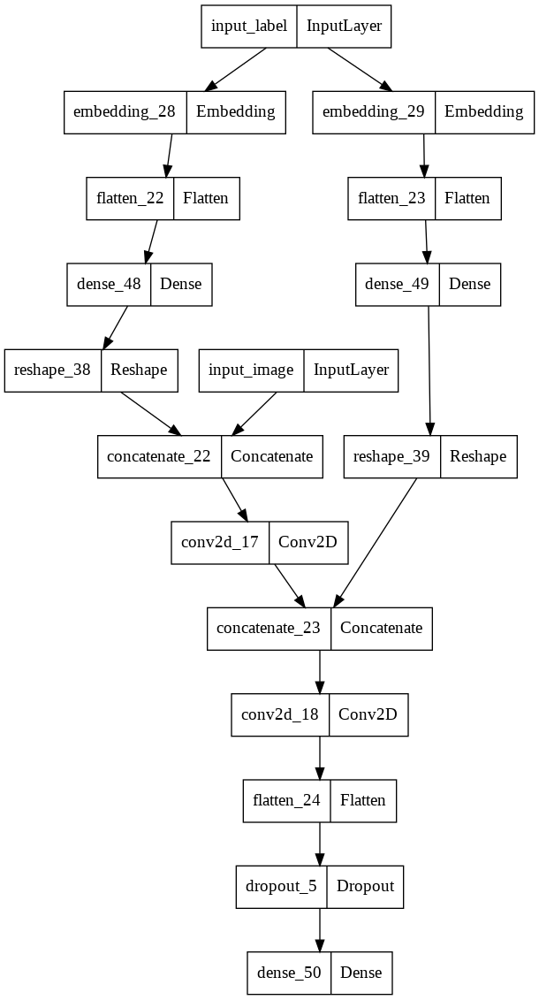

In [69]:
# plot the discriminator model
tf.keras.utils.plot_model(a)

## **Generator** Model

In [70]:
def define_generator(latent_dim = 100, n_classes=5):

  # label input
  in_label = Input(shape=(5,), name='in_label')
  li_embedd = Embedding(n_classes, 50)(in_label)
  li_embedd = Flatten()(li_embedd)
  li = Dense(7 * 7, activation='relu')(li_embedd)
  li = Reshape((7, 7, 1))(li)

  # latent input
  in_latent = Input(shape=(latent_dim,), name='in_latent')

  n_nodes = 128 * 7 * 7
  gen = Dense(n_nodes, activation = 'relu')(in_latent)
  gen = Reshape((7, 7, 128))(gen)

  # concate 1
  merge = Concatenate()([gen, li])

  gen = Conv2DTranspose(128, (3,3), strides=(2,2), padding='same', activation = 'relu')(merge)

  # concate 2
  se1 = Dense(14*14, activation='relu')(li_embedd)
  se1 = Reshape((14, 14, 1))(se1)
  merge1 = Concatenate()([gen, se1])
  gen = Conv2DTranspose(128, (3,3), strides=(2,2), padding='same', activation = 'relu')(merge1)

  # final layer
  out_layer = Conv2D(1, (7,7), activation='tanh', padding='same')(gen)

  model = Model([in_latent, in_label], out_layer)
  return model
b = define_generator(100)
b.summary()

Model: "model_16"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 in_label (InputLayer)          [(None, 5)]          0           []                               
                                                                                                  
 embedding_30 (Embedding)       (None, 5, 50)        250         ['in_label[0][0]']               
                                                                                                  
 in_latent (InputLayer)         [(None, 100)]        0           []                               
                                                                                                  
 flatten_25 (Flatten)           (None, 250)          0           ['embedding_30[0][0]']           
                                                                                           

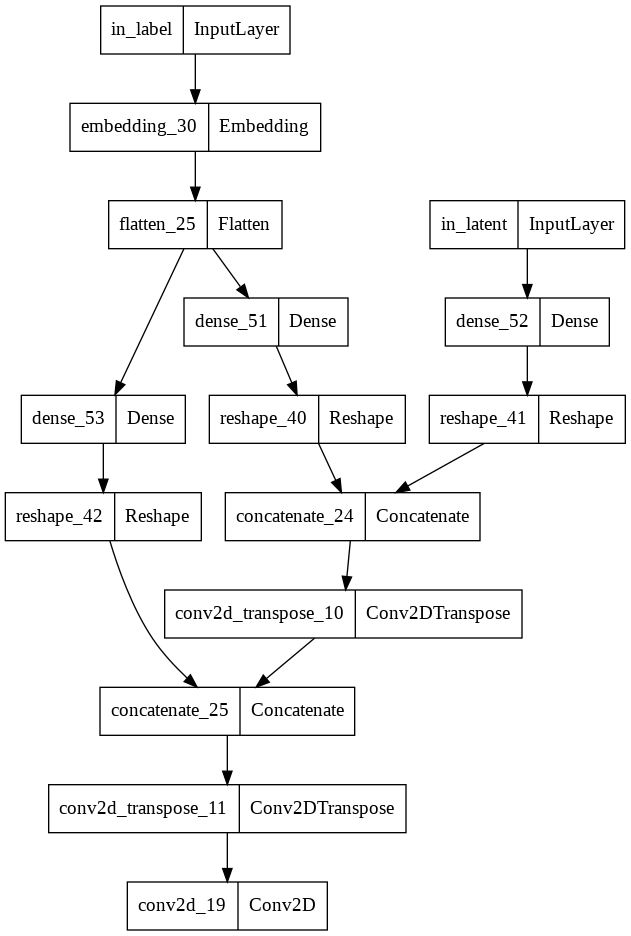

In [71]:
# plot the generator model
tf.keras.utils.plot_model(b)

## **Combine** or **GAN** Model

In [72]:
def define_gan(g_model, d_model):

  d_model.trainable = False

  gen_noise, gen_label = g_model.input
  gen_output = g_model.output

  gan_output = d_model([gen_output, gen_label])

  model = Model([gen_noise, gen_label], gan_output)

  opt = Adam(learning_rate= 3e-4, beta_1=0.5)
  model.compile(loss='binary_crossentropy', optimizer=opt,  metrics=['accuracy'])
  
  return model
c = define_gan(b, a)
c.summary()

Model: "model_17"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 in_label (InputLayer)          [(None, 5)]          0           []                               
                                                                                                  
 embedding_30 (Embedding)       (None, 5, 50)        250         ['in_label[0][0]']               
                                                                                                  
 in_latent (InputLayer)         [(None, 100)]        0           []                               
                                                                                                  
 flatten_25 (Flatten)           (None, 250)          0           ['embedding_30[0][0]']           
                                                                                           

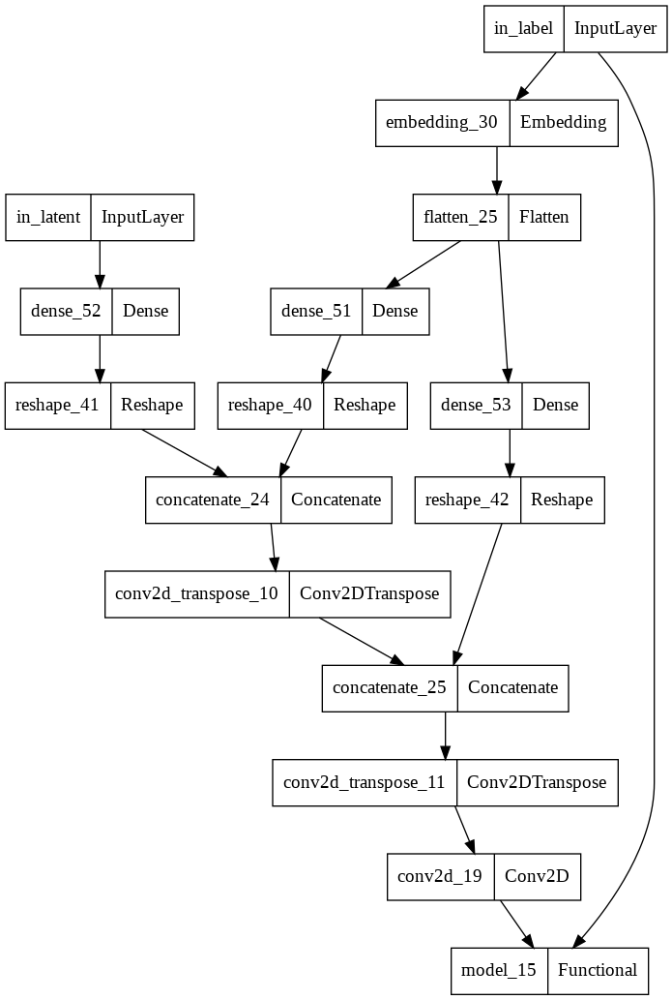

In [73]:
# plot GAN model
tf.keras.utils.plot_model(c)

## Load Mnist Dataset

In [74]:
def load_real_samples():
  # random.seed(1)
  # load dataset
  (trainX, trainy), (_, _) = mnist.load_data()
  trainy = randint(0, 5, trainX.shape[0])
  # expand to 3d, e.g. add channels
  X = expand_dims(trainX, axis=-1)
  X = X.astype('float32')
  # scale from [0,255] to [-1,1]
  X = (X - 127.5) / 127.5
  return [X, trainy]
k = load_real_samples()
print("image: ",k[0].shape," Lable: ",k[1].shape)
print("\nshape/size of the first 16 data: ",k[0][:16].shape)
print(k[1][:20])
print(k[1].shape)

image:  (60000, 28, 28, 1)  Lable:  (60000,)

shape/size of the first 16 data:  (16, 28, 28, 1)
[3 4 0 1 3 0 0 1 4 4 1 2 4 2 4 3 4 2 4 2]
(60000,)


## Plot data with label

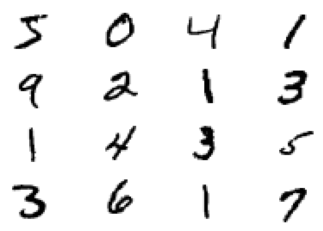

In [75]:
def save_plot(x_input,lebel,n=4):
    for i in range(n*n):
        plt.subplot(n, n, i+1)
        # plt.title(str(lebel[i]),fontsize=10,color="red",fontweight=10,pad='2.0',backgroundcolor='yellow')
        plt.imshow(x_input[i,:,:,0], cmap = 'gray_r')
        plt.axis('off')
    plt.show()
# plot data
save_plot(k[0][:16], k[1][:16])

## Generate real sample function

In [76]:
def generate_real_samples(dataset, n_samples):
	images, labels = dataset
	ix = randint(0, images.shape[0], n_samples)
	X, labels = images[ix], labels[ix]
	arbt_labels = np.array([randint(0, 5, 5) for _ in range(n_samples)])
	y = ones((n_samples, 1))
	return [X, arbt_labels], y
	
d = generate_real_samples(k, 32)
print("Generate real data as a batch randomly: ",d[0][0].shape, d[0][1].shape)
print(d[0][1][:3])

Generate real data as a batch randomly:  (32, 28, 28, 1) (32, 5)
[[1 0 0 0 4]
 [1 3 3 3 0]
 [3 2 2 3 1]]


## Generate latent point function

In [77]:
def generate_latent_points(latent_dim, n_samples, n_classes=5):
  # random.seed(1)
  x_input = randn(latent_dim * n_samples)
  z_input = x_input.reshape(n_samples, latent_dim)
  # labels = randint(0, n_classes, n_samples)
  labels=np.array([randint(0, 5, 5) for _ in range(n_samples)])
  # for _ in range(n_samples):
    # pk = randint(0, n_classes, n_samples)
  return [z_input, labels]
p = generate_latent_points(100, 32)
print("Generate latent point(with label) as a batch: ",p[0].shape,p[1].shape)
print(p[1][:3])

Generate latent point(with label) as a batch:  (32, 100) (32, 5)
[[0 3 2 0 0]
 [1 1 4 1 3]
 [4 1 3 2 4]]


## Generate Fake samples of image with label

In [78]:
def generate_fake_samples(generator, latent_dim, n_samples):
	z_input, labels_input = generate_latent_points(latent_dim, n_samples)
	images = generator.predict([z_input, labels_input])
	y = zeros((n_samples, 1))
	return [images, labels_input], y
with tf.device(device_name):
  kh = generate_fake_samples(b, 100, 32)
  print("shape of the generated images: ",kh[0][0].shape)

1/1 [==============================] - 0s 117ms/step
shape of the generated images:  (32, 28, 28, 1)


## Summarize the generator model

In [79]:
def summarize_the_model(generator,latent_dim = 100):
    latent_points, labels = generate_latent_points(latent_dim= 100, n_samples= 16)
    X  = generator.predict([latent_points, labels])
    # scale from [-1,1] to [0,1]
    # X = (X + 1) / 2.0
    save_plot(X, labels, n=4)

## Train function

In [80]:
def train(g_model, d_model, gan_model, dataset, latent_dim= 100, n_epochs=3, n_batch=128):
  # random.seed(1)

  print("No. of epoch: ",n_epochs)
  bat_per_epo = int(dataset[0].shape[0] / n_batch)
  print("batch per epoch: ", bat_per_epo)
  print("full batch: ",n_batch)
  half_batch = int(n_batch / 2)
  print("half batch: ", half_batch,'\n')
  print("*"*50,'\n\n')

  d_loss_real_array,d_loss_fake_array =[],[]
  g_loss_array = []
  for i in range(n_epochs):
    d_loss_r,d_loss_f = 0.0,0.0
    g_loss = 0.0
    
    for j in range(bat_per_epo):

      [X_real, labels_real], y_real = generate_real_samples(dataset, half_batch)
      d_loss1, _ = d_model.train_on_batch([X_real, labels_real], y_real)
      d_loss_r += d_loss1

      [X_fake, labels], y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
      d_loss2, _ = d_model.train_on_batch([X_fake, labels], y_fake)
      d_loss_f += d_loss2

      [z_input, labels_input] = generate_latent_points(latent_dim, n_batch)
      y_gan = ones((n_batch, 1))
      g_loss1,_ = gan_model.train_on_batch([z_input, labels_input], y_gan)
      g_loss += g_loss1

    d_loss_real_array.append(d_loss_r)
    d_loss_fake_array.append(d_loss_f)
    g_loss_array.append(g_loss)

    print('epoch -> [%d/%d], discriminator_loss_for_real_data = %.2f, discriminator_loss_for_fake_data = %.2f, generator_loss = %.2f\n' %(i+1, n_epochs, d_loss_r, d_loss_f, g_loss))
    summarize_the_model(g_model)
    # g_model.save("g_gan_model_"+str(i)+".h5")
    g_model.save("/content/drive/MyDrive/C-GAN-Case-B/1/generator_model.h5")
    np.savez_compressed('/content/drive/MyDrive/C-GAN-Case-B/1/loss_record.npz', a=d_loss_real_array, b=d_loss_fake_array, c=g_loss_array)

    print("\n")

  return d_loss_real_array, d_loss_fake_array, g_loss_array

## Main function


READY TO GO !!!

No. of epoch:  200
batch per epoch:  468
full batch:  128
half batch:  64 

************************************************** 


2/2 [==============================] - 0s 6ms/step
epoch -> [1/200], discriminator_loss_for_real_data = 270.90, discriminator_loss_for_fake_data = 279.62, generator_loss = 568.86

1/1 [==============================] - 0s 111ms/step


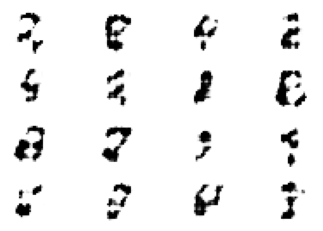



2/2 [==============================] - 0s 6ms/step
epoch -> [2/200], discriminator_loss_for_real_data = 309.80, discriminator_loss_for_fake_data = 315.79, generator_loss = 374.86

1/1 [==============================] - 0s 17ms/step


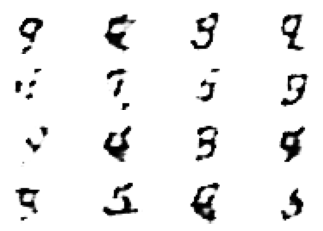



2/2 [==============================] - 0s 6ms/step
epoch -> [3/200], discriminator_loss_for_real_data = 309.25, discriminator_loss_for_fake_data = 311.23, generator_loss = 369.81

1/1 [==============================] - 0s 14ms/step


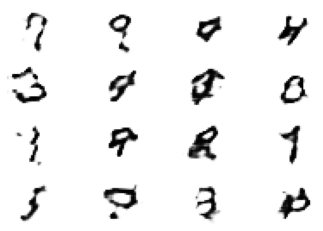



2/2 [==============================] - 0s 8ms/step
epoch -> [4/200], discriminator_loss_for_real_data = 313.10, discriminator_loss_for_fake_data = 316.84, generator_loss = 356.36

1/1 [==============================] - 0s 14ms/step


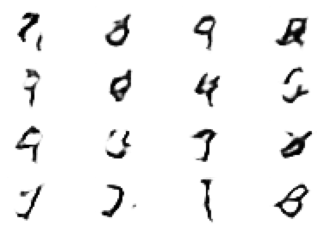



2/2 [==============================] - 0s 9ms/step
epoch -> [5/200], discriminator_loss_for_real_data = 314.31, discriminator_loss_for_fake_data = 317.49, generator_loss = 355.15

1/1 [==============================] - 0s 16ms/step


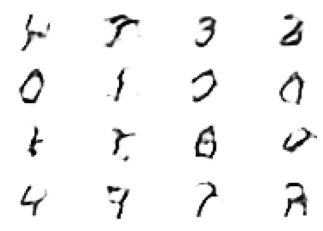



2/2 [==============================] - 0s 8ms/step
epoch -> [6/200], discriminator_loss_for_real_data = 311.98, discriminator_loss_for_fake_data = 316.44, generator_loss = 357.26

1/1 [==============================] - 0s 17ms/step


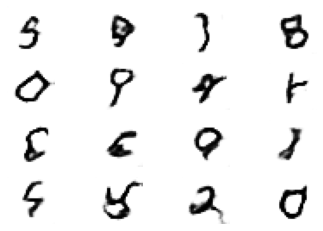



2/2 [==============================] - 0s 10ms/step
epoch -> [7/200], discriminator_loss_for_real_data = 310.46, discriminator_loss_for_fake_data = 315.30, generator_loss = 362.71

1/1 [==============================] - 0s 21ms/step


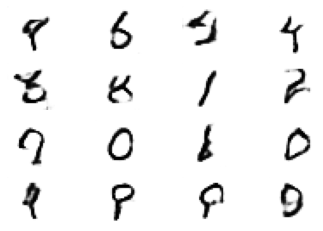



2/2 [==============================] - 0s 4ms/step
epoch -> [8/200], discriminator_loss_for_real_data = 310.31, discriminator_loss_for_fake_data = 314.29, generator_loss = 364.42

1/1 [==============================] - 0s 16ms/step


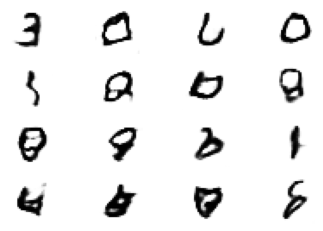



2/2 [==============================] - 0s 6ms/step
epoch -> [9/200], discriminator_loss_for_real_data = 310.22, discriminator_loss_for_fake_data = 313.75, generator_loss = 366.63

1/1 [==============================] - 0s 17ms/step


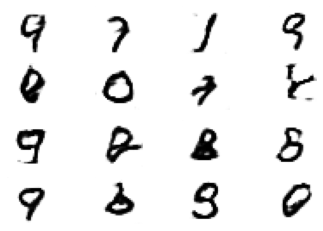



2/2 [==============================] - 0s 11ms/step
epoch -> [10/200], discriminator_loss_for_real_data = 310.87, discriminator_loss_for_fake_data = 313.68, generator_loss = 367.45

1/1 [==============================] - 0s 15ms/step


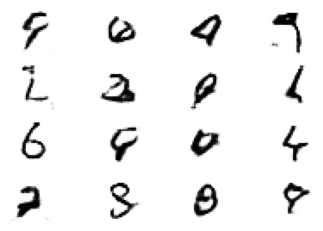



2/2 [==============================] - 0s 12ms/step
epoch -> [11/200], discriminator_loss_for_real_data = 312.23, discriminator_loss_for_fake_data = 314.06, generator_loss = 364.96

1/1 [==============================] - 0s 15ms/step


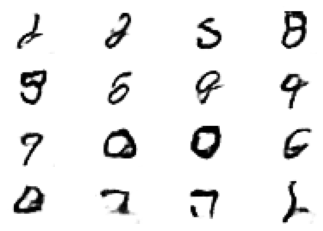



2/2 [==============================] - 0s 5ms/step
epoch -> [12/200], discriminator_loss_for_real_data = 313.31, discriminator_loss_for_fake_data = 315.03, generator_loss = 363.14

1/1 [==============================] - 0s 28ms/step


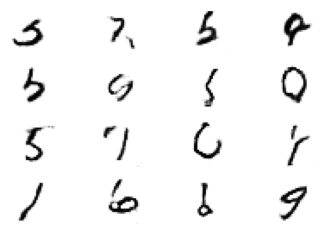



2/2 [==============================] - 0s 5ms/step
epoch -> [13/200], discriminator_loss_for_real_data = 314.30, discriminator_loss_for_fake_data = 316.32, generator_loss = 360.36

1/1 [==============================] - 0s 14ms/step


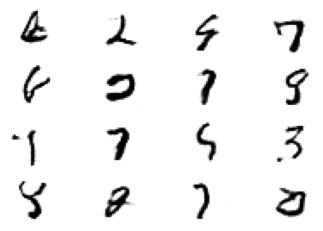



2/2 [==============================] - 0s 15ms/step
epoch -> [14/200], discriminator_loss_for_real_data = 315.73, discriminator_loss_for_fake_data = 317.36, generator_loss = 357.77

1/1 [==============================] - 0s 15ms/step


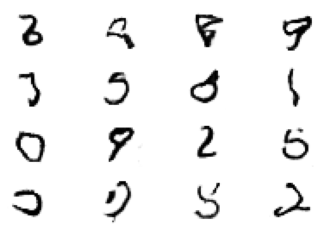



2/2 [==============================] - 0s 6ms/step
epoch -> [15/200], discriminator_loss_for_real_data = 316.26, discriminator_loss_for_fake_data = 318.00, generator_loss = 355.35

1/1 [==============================] - 0s 17ms/step


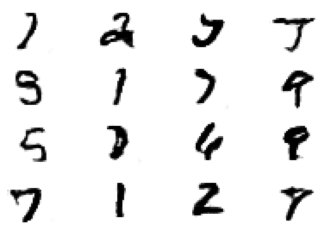



2/2 [==============================] - 0s 6ms/step
epoch -> [16/200], discriminator_loss_for_real_data = 316.98, discriminator_loss_for_fake_data = 318.76, generator_loss = 354.20

1/1 [==============================] - 0s 14ms/step


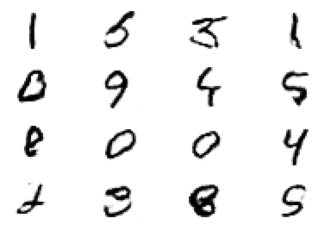



2/2 [==============================] - 0s 5ms/step
epoch -> [17/200], discriminator_loss_for_real_data = 316.76, discriminator_loss_for_fake_data = 319.01, generator_loss = 352.11

1/1 [==============================] - 0s 17ms/step


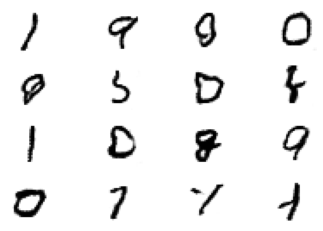



2/2 [==============================] - 0s 5ms/step
epoch -> [18/200], discriminator_loss_for_real_data = 317.71, discriminator_loss_for_fake_data = 319.02, generator_loss = 351.22

1/1 [==============================] - 0s 14ms/step


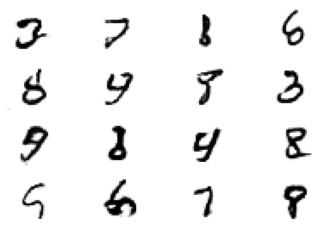



2/2 [==============================] - 0s 6ms/step
epoch -> [19/200], discriminator_loss_for_real_data = 317.94, discriminator_loss_for_fake_data = 319.23, generator_loss = 349.79

1/1 [==============================] - 0s 16ms/step


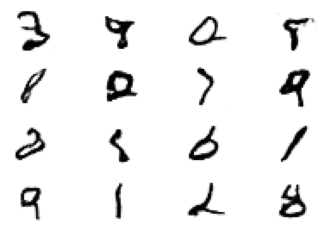



2/2 [==============================] - 0s 8ms/step
epoch -> [20/200], discriminator_loss_for_real_data = 317.93, discriminator_loss_for_fake_data = 319.23, generator_loss = 349.17

1/1 [==============================] - 0s 16ms/step


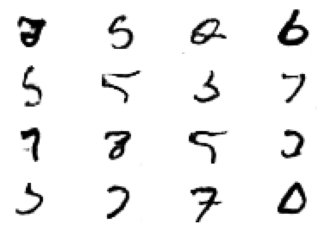



2/2 [==============================] - 0s 7ms/step
epoch -> [21/200], discriminator_loss_for_real_data = 317.98, discriminator_loss_for_fake_data = 319.41, generator_loss = 348.93

1/1 [==============================] - 0s 15ms/step


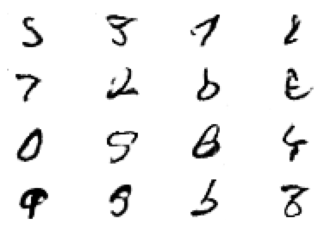



2/2 [==============================] - 0s 6ms/step
epoch -> [22/200], discriminator_loss_for_real_data = 318.00, discriminator_loss_for_fake_data = 318.85, generator_loss = 349.61

1/1 [==============================] - 0s 20ms/step


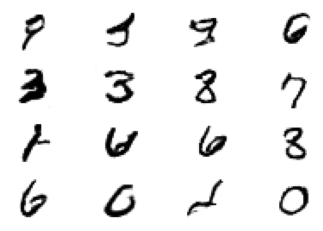



2/2 [==============================] - 0s 14ms/step
epoch -> [23/200], discriminator_loss_for_real_data = 318.09, discriminator_loss_for_fake_data = 318.89, generator_loss = 349.66

1/1 [==============================] - 0s 15ms/step


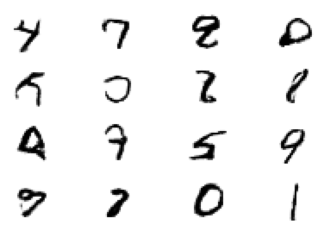



2/2 [==============================] - 0s 11ms/step
epoch -> [24/200], discriminator_loss_for_real_data = 317.96, discriminator_loss_for_fake_data = 319.63, generator_loss = 347.91

1/1 [==============================] - 0s 16ms/step


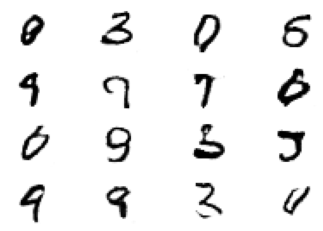



2/2 [==============================] - 0s 4ms/step
epoch -> [25/200], discriminator_loss_for_real_data = 317.92, discriminator_loss_for_fake_data = 319.11, generator_loss = 348.60

1/1 [==============================] - 0s 15ms/step


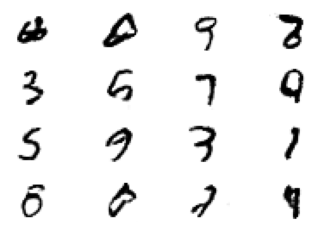



2/2 [==============================] - 0s 10ms/step
epoch -> [26/200], discriminator_loss_for_real_data = 317.76, discriminator_loss_for_fake_data = 319.15, generator_loss = 348.59

1/1 [==============================] - 0s 17ms/step


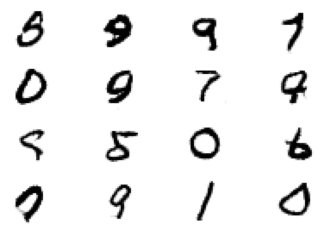



2/2 [==============================] - 0s 6ms/step
epoch -> [27/200], discriminator_loss_for_real_data = 318.14, discriminator_loss_for_fake_data = 318.68, generator_loss = 348.53

1/1 [==============================] - 0s 16ms/step


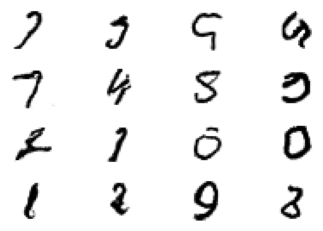



2/2 [==============================] - 0s 5ms/step
epoch -> [28/200], discriminator_loss_for_real_data = 318.03, discriminator_loss_for_fake_data = 318.98, generator_loss = 347.49

1/1 [==============================] - 0s 17ms/step


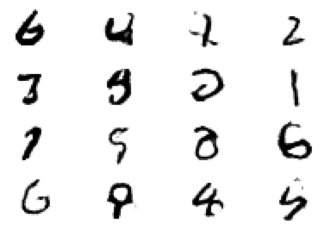



2/2 [==============================] - 0s 16ms/step
epoch -> [29/200], discriminator_loss_for_real_data = 316.96, discriminator_loss_for_fake_data = 319.11, generator_loss = 348.02

1/1 [==============================] - 0s 16ms/step


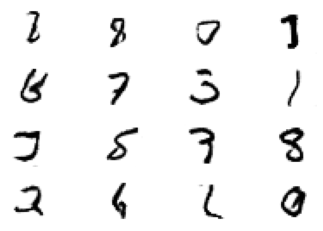



2/2 [==============================] - 0s 6ms/step
epoch -> [30/200], discriminator_loss_for_real_data = 317.58, discriminator_loss_for_fake_data = 318.67, generator_loss = 347.81

1/1 [==============================] - 0s 16ms/step


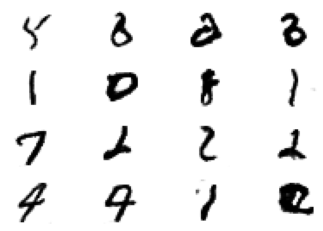



2/2 [==============================] - 0s 5ms/step
epoch -> [31/200], discriminator_loss_for_real_data = 317.62, discriminator_loss_for_fake_data = 318.04, generator_loss = 348.99

1/1 [==============================] - 0s 20ms/step


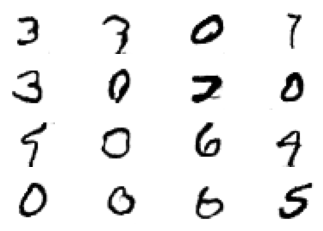



2/2 [==============================] - 0s 5ms/step
epoch -> [32/200], discriminator_loss_for_real_data = 317.29, discriminator_loss_for_fake_data = 318.38, generator_loss = 348.91

1/1 [==============================] - 0s 14ms/step


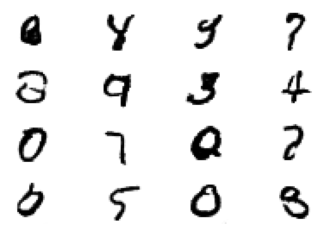



2/2 [==============================] - 0s 8ms/step
epoch -> [33/200], discriminator_loss_for_real_data = 317.14, discriminator_loss_for_fake_data = 318.40, generator_loss = 348.88

1/1 [==============================] - 0s 14ms/step


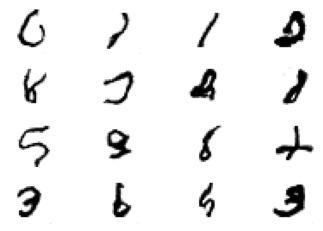



2/2 [==============================] - 0s 4ms/step
epoch -> [34/200], discriminator_loss_for_real_data = 317.76, discriminator_loss_for_fake_data = 318.72, generator_loss = 348.84

1/1 [==============================] - 0s 17ms/step


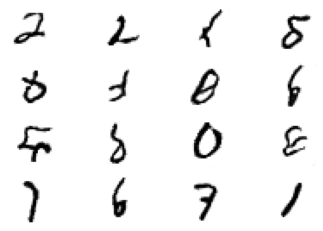



2/2 [==============================] - 0s 7ms/step
epoch -> [35/200], discriminator_loss_for_real_data = 316.42, discriminator_loss_for_fake_data = 318.38, generator_loss = 348.27

1/1 [==============================] - 0s 17ms/step


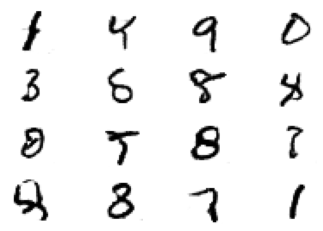



2/2 [==============================] - 0s 5ms/step
epoch -> [36/200], discriminator_loss_for_real_data = 316.65, discriminator_loss_for_fake_data = 317.81, generator_loss = 349.71

1/1 [==============================] - 0s 14ms/step


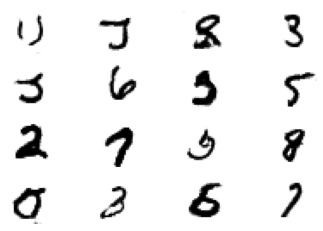



2/2 [==============================] - 0s 9ms/step
epoch -> [37/200], discriminator_loss_for_real_data = 316.67, discriminator_loss_for_fake_data = 317.81, generator_loss = 350.30

1/1 [==============================] - 0s 15ms/step


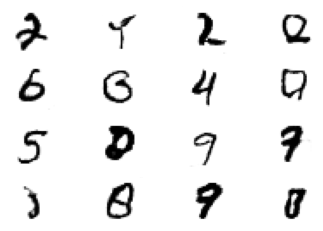



2/2 [==============================] - 0s 9ms/step
epoch -> [38/200], discriminator_loss_for_real_data = 316.68, discriminator_loss_for_fake_data = 318.11, generator_loss = 350.69

1/1 [==============================] - 0s 15ms/step


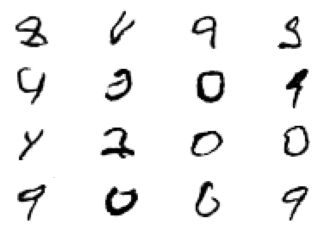



2/2 [==============================] - 0s 8ms/step
epoch -> [39/200], discriminator_loss_for_real_data = 316.49, discriminator_loss_for_fake_data = 317.41, generator_loss = 350.57

1/1 [==============================] - 0s 14ms/step


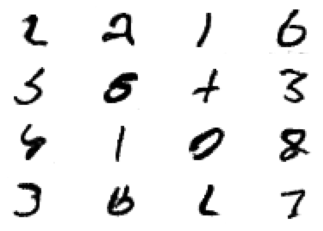



2/2 [==============================] - 0s 11ms/step
epoch -> [40/200], discriminator_loss_for_real_data = 316.78, discriminator_loss_for_fake_data = 318.12, generator_loss = 349.99

1/1 [==============================] - 0s 18ms/step


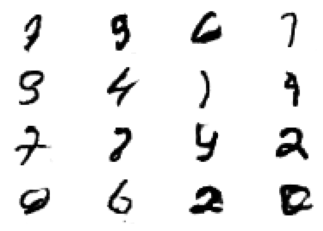



2/2 [==============================] - 0s 11ms/step
epoch -> [41/200], discriminator_loss_for_real_data = 315.58, discriminator_loss_for_fake_data = 317.81, generator_loss = 349.81

1/1 [==============================] - 0s 14ms/step


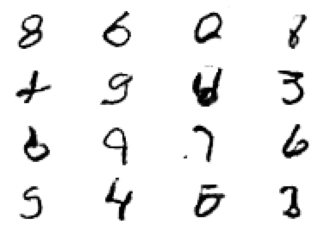



2/2 [==============================] - 0s 4ms/step
epoch -> [42/200], discriminator_loss_for_real_data = 316.21, discriminator_loss_for_fake_data = 317.94, generator_loss = 349.97

1/1 [==============================] - 0s 15ms/step


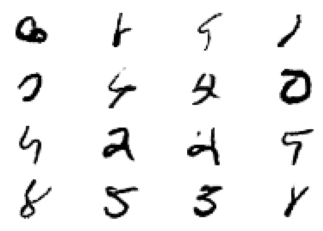



2/2 [==============================] - 0s 5ms/step
epoch -> [43/200], discriminator_loss_for_real_data = 316.03, discriminator_loss_for_fake_data = 317.41, generator_loss = 350.74

1/1 [==============================] - 0s 15ms/step


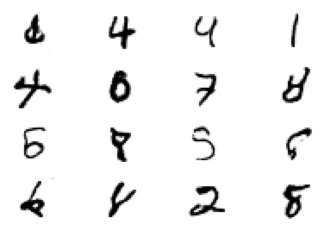



2/2 [==============================] - 0s 12ms/step
epoch -> [44/200], discriminator_loss_for_real_data = 315.99, discriminator_loss_for_fake_data = 317.33, generator_loss = 351.40

1/1 [==============================] - 0s 23ms/step


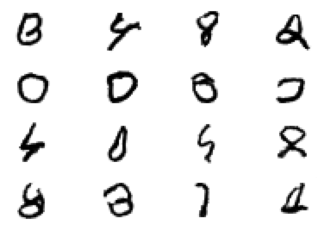



2/2 [==============================] - 0s 5ms/step
epoch -> [45/200], discriminator_loss_for_real_data = 315.84, discriminator_loss_for_fake_data = 317.11, generator_loss = 351.79

1/1 [==============================] - 0s 18ms/step


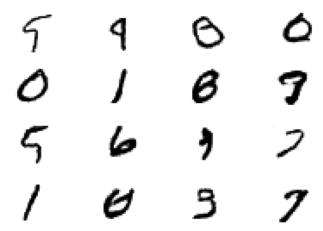



2/2 [==============================] - 0s 8ms/step
epoch -> [46/200], discriminator_loss_for_real_data = 314.94, discriminator_loss_for_fake_data = 316.89, generator_loss = 351.72

1/1 [==============================] - 0s 16ms/step


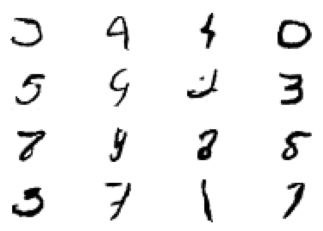



2/2 [==============================] - 0s 5ms/step
epoch -> [47/200], discriminator_loss_for_real_data = 315.86, discriminator_loss_for_fake_data = 316.89, generator_loss = 351.86

1/1 [==============================] - 0s 18ms/step


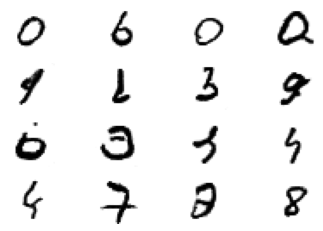



2/2 [==============================] - 0s 13ms/step
epoch -> [48/200], discriminator_loss_for_real_data = 315.22, discriminator_loss_for_fake_data = 315.89, generator_loss = 353.06

1/1 [==============================] - 0s 16ms/step


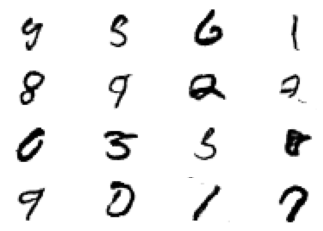



2/2 [==============================] - 0s 11ms/step
epoch -> [49/200], discriminator_loss_for_real_data = 314.89, discriminator_loss_for_fake_data = 316.90, generator_loss = 352.95

1/1 [==============================] - 0s 17ms/step


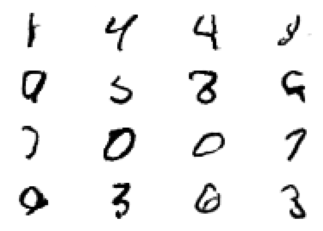



2/2 [==============================] - 0s 14ms/step
epoch -> [50/200], discriminator_loss_for_real_data = 314.78, discriminator_loss_for_fake_data = 316.09, generator_loss = 354.18

1/1 [==============================] - 0s 15ms/step


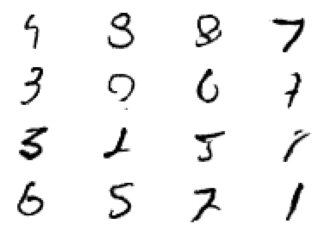



2/2 [==============================] - 0s 13ms/step
epoch -> [51/200], discriminator_loss_for_real_data = 314.98, discriminator_loss_for_fake_data = 316.25, generator_loss = 354.56

1/1 [==============================] - 0s 18ms/step


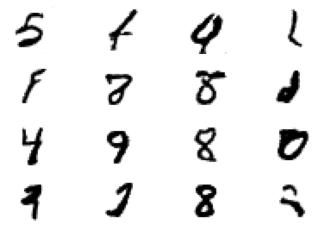



2/2 [==============================] - 0s 6ms/step
epoch -> [52/200], discriminator_loss_for_real_data = 314.16, discriminator_loss_for_fake_data = 315.95, generator_loss = 354.86

1/1 [==============================] - 0s 14ms/step


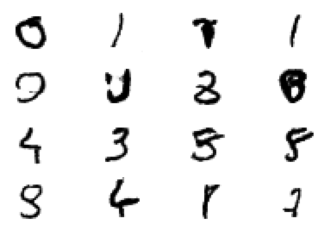



2/2 [==============================] - 0s 18ms/step
epoch -> [53/200], discriminator_loss_for_real_data = 315.35, discriminator_loss_for_fake_data = 315.35, generator_loss = 355.90

1/1 [==============================] - 0s 14ms/step


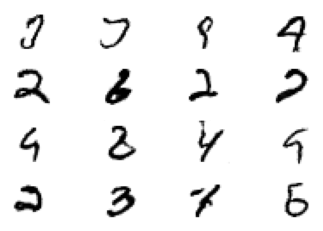



2/2 [==============================] - 0s 5ms/step
epoch -> [54/200], discriminator_loss_for_real_data = 313.36, discriminator_loss_for_fake_data = 315.50, generator_loss = 355.94

1/1 [==============================] - 0s 20ms/step


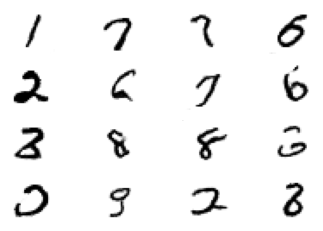



2/2 [==============================] - 0s 5ms/step
epoch -> [55/200], discriminator_loss_for_real_data = 314.18, discriminator_loss_for_fake_data = 314.73, generator_loss = 355.77

1/1 [==============================] - 0s 19ms/step


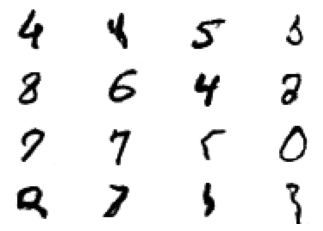



2/2 [==============================] - 0s 12ms/step
epoch -> [56/200], discriminator_loss_for_real_data = 314.38, discriminator_loss_for_fake_data = 314.83, generator_loss = 356.20

1/1 [==============================] - 0s 14ms/step


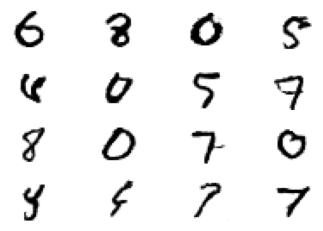



2/2 [==============================] - 0s 6ms/step
epoch -> [57/200], discriminator_loss_for_real_data = 313.54, discriminator_loss_for_fake_data = 315.59, generator_loss = 356.88

1/1 [==============================] - 0s 30ms/step


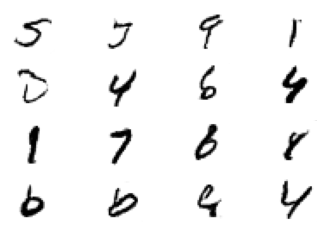



2/2 [==============================] - 0s 6ms/step
epoch -> [58/200], discriminator_loss_for_real_data = 314.36, discriminator_loss_for_fake_data = 314.78, generator_loss = 358.10

1/1 [==============================] - 0s 23ms/step


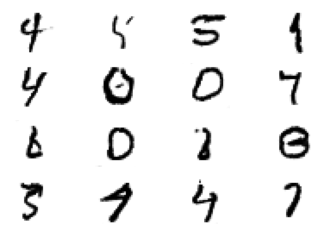



2/2 [==============================] - 0s 4ms/step
epoch -> [59/200], discriminator_loss_for_real_data = 313.47, discriminator_loss_for_fake_data = 315.08, generator_loss = 357.29

1/1 [==============================] - 0s 21ms/step


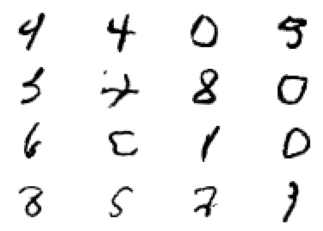



2/2 [==============================] - 0s 5ms/step
epoch -> [60/200], discriminator_loss_for_real_data = 313.71, discriminator_loss_for_fake_data = 314.82, generator_loss = 357.95

1/1 [==============================] - 0s 20ms/step


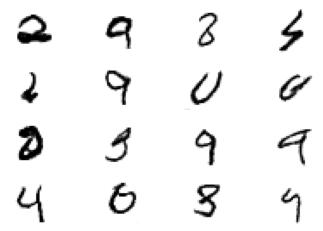



2/2 [==============================] - 0s 7ms/step
epoch -> [61/200], discriminator_loss_for_real_data = 313.05, discriminator_loss_for_fake_data = 315.07, generator_loss = 359.39

1/1 [==============================] - 0s 14ms/step


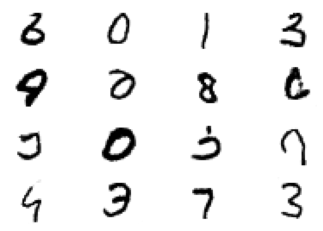



2/2 [==============================] - 0s 6ms/step
epoch -> [62/200], discriminator_loss_for_real_data = 313.24, discriminator_loss_for_fake_data = 314.10, generator_loss = 359.07

1/1 [==============================] - 0s 15ms/step


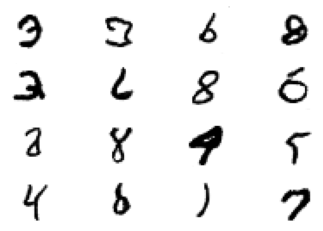



2/2 [==============================] - 0s 6ms/step
epoch -> [63/200], discriminator_loss_for_real_data = 313.13, discriminator_loss_for_fake_data = 313.65, generator_loss = 359.63

1/1 [==============================] - 0s 14ms/step


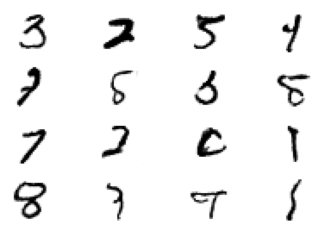



2/2 [==============================] - 0s 5ms/step
epoch -> [64/200], discriminator_loss_for_real_data = 313.09, discriminator_loss_for_fake_data = 313.83, generator_loss = 358.50

1/1 [==============================] - 0s 36ms/step


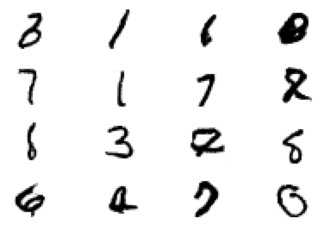



2/2 [==============================] - 0s 6ms/step
epoch -> [65/200], discriminator_loss_for_real_data = 311.66, discriminator_loss_for_fake_data = 314.14, generator_loss = 360.65

1/1 [==============================] - 0s 24ms/step


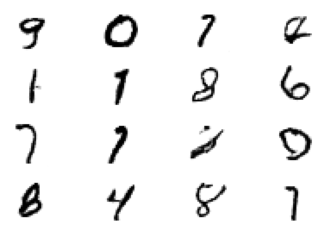



2/2 [==============================] - 0s 6ms/step
epoch -> [66/200], discriminator_loss_for_real_data = 312.07, discriminator_loss_for_fake_data = 313.14, generator_loss = 361.65

1/1 [==============================] - 0s 22ms/step


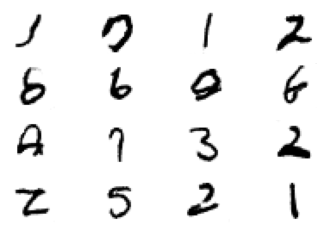



2/2 [==============================] - 0s 10ms/step
epoch -> [67/200], discriminator_loss_for_real_data = 312.44, discriminator_loss_for_fake_data = 313.22, generator_loss = 362.75

1/1 [==============================] - 0s 15ms/step


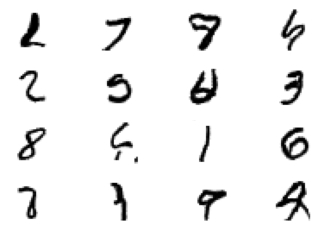



2/2 [==============================] - 0s 4ms/step
epoch -> [68/200], discriminator_loss_for_real_data = 312.49, discriminator_loss_for_fake_data = 313.05, generator_loss = 361.99

1/1 [==============================] - 0s 14ms/step


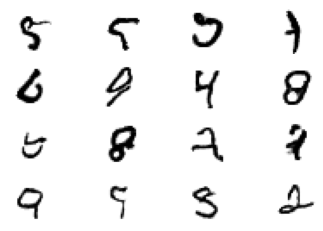



2/2 [==============================] - 0s 6ms/step
epoch -> [69/200], discriminator_loss_for_real_data = 311.94, discriminator_loss_for_fake_data = 312.45, generator_loss = 364.87

1/1 [==============================] - 0s 14ms/step


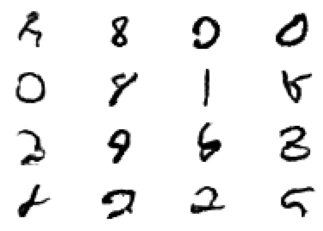



2/2 [==============================] - 0s 5ms/step
epoch -> [70/200], discriminator_loss_for_real_data = 310.88, discriminator_loss_for_fake_data = 312.86, generator_loss = 364.21

1/1 [==============================] - 0s 24ms/step


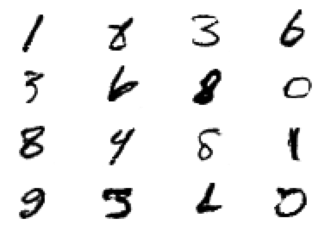



2/2 [==============================] - 0s 6ms/step
epoch -> [71/200], discriminator_loss_for_real_data = 311.71, discriminator_loss_for_fake_data = 311.62, generator_loss = 365.14

1/1 [==============================] - 0s 24ms/step


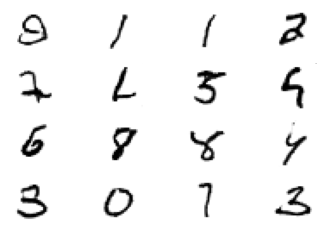



2/2 [==============================] - 0s 4ms/step
epoch -> [72/200], discriminator_loss_for_real_data = 310.77, discriminator_loss_for_fake_data = 311.31, generator_loss = 365.15

1/1 [==============================] - 0s 15ms/step


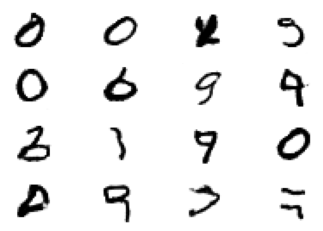



2/2 [==============================] - 0s 7ms/step
epoch -> [73/200], discriminator_loss_for_real_data = 310.66, discriminator_loss_for_fake_data = 311.76, generator_loss = 367.14

1/1 [==============================] - 0s 16ms/step


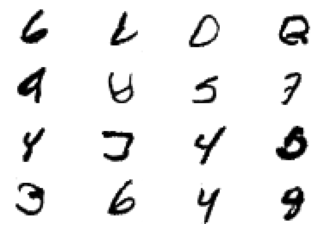



2/2 [==============================] - 0s 4ms/step
epoch -> [74/200], discriminator_loss_for_real_data = 310.21, discriminator_loss_for_fake_data = 310.57, generator_loss = 367.49

1/1 [==============================] - 0s 19ms/step


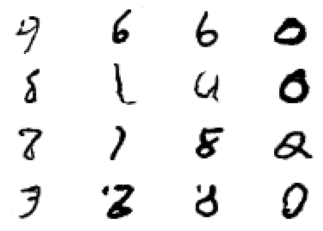



2/2 [==============================] - 0s 11ms/step
epoch -> [75/200], discriminator_loss_for_real_data = 310.18, discriminator_loss_for_fake_data = 310.88, generator_loss = 368.15

1/1 [==============================] - 0s 14ms/step


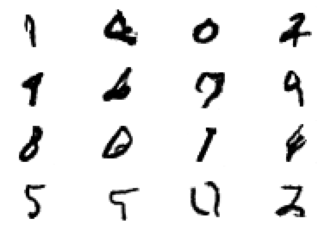



2/2 [==============================] - 0s 5ms/step
epoch -> [76/200], discriminator_loss_for_real_data = 310.07, discriminator_loss_for_fake_data = 310.09, generator_loss = 369.68

1/1 [==============================] - 0s 16ms/step


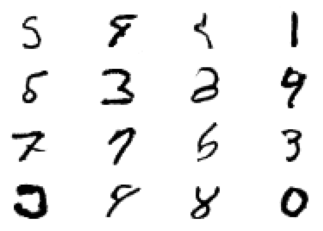



2/2 [==============================] - 0s 9ms/step
epoch -> [77/200], discriminator_loss_for_real_data = 309.24, discriminator_loss_for_fake_data = 308.88, generator_loss = 371.83

1/1 [==============================] - 0s 15ms/step


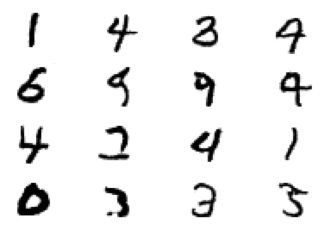



2/2 [==============================] - 0s 12ms/step
epoch -> [78/200], discriminator_loss_for_real_data = 308.43, discriminator_loss_for_fake_data = 309.69, generator_loss = 370.31

1/1 [==============================] - 0s 15ms/step


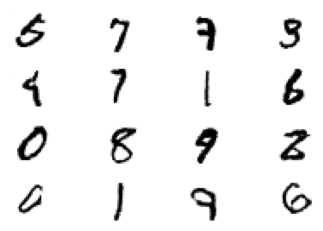



2/2 [==============================] - 0s 12ms/step
epoch -> [79/200], discriminator_loss_for_real_data = 309.60, discriminator_loss_for_fake_data = 309.41, generator_loss = 372.35

1/1 [==============================] - 0s 14ms/step


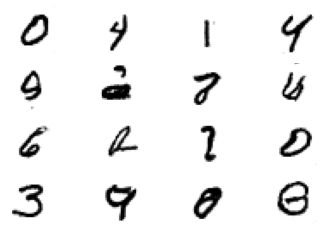



2/2 [==============================] - 0s 11ms/step
epoch -> [80/200], discriminator_loss_for_real_data = 308.51, discriminator_loss_for_fake_data = 307.95, generator_loss = 373.52

1/1 [==============================] - 0s 14ms/step


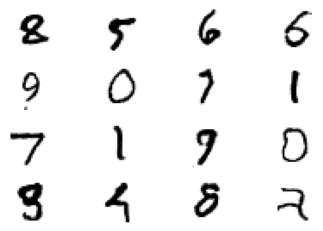



2/2 [==============================] - 0s 4ms/step
epoch -> [81/200], discriminator_loss_for_real_data = 308.10, discriminator_loss_for_fake_data = 309.36, generator_loss = 372.52

1/1 [==============================] - 0s 18ms/step


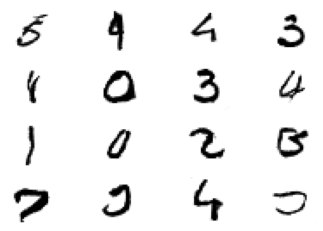



2/2 [==============================] - 0s 9ms/step
epoch -> [82/200], discriminator_loss_for_real_data = 307.76, discriminator_loss_for_fake_data = 308.25, generator_loss = 373.41

1/1 [==============================] - 0s 14ms/step


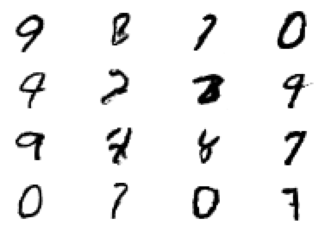



2/2 [==============================] - 0s 5ms/step
epoch -> [83/200], discriminator_loss_for_real_data = 307.80, discriminator_loss_for_fake_data = 306.79, generator_loss = 375.97

1/1 [==============================] - 0s 21ms/step


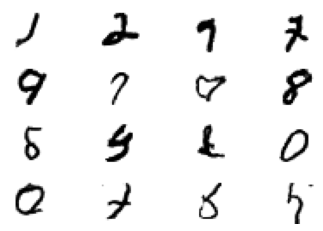



2/2 [==============================] - 0s 5ms/step
epoch -> [84/200], discriminator_loss_for_real_data = 307.63, discriminator_loss_for_fake_data = 307.81, generator_loss = 376.56

1/1 [==============================] - 0s 18ms/step


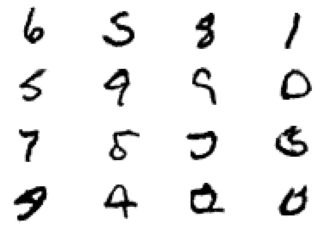



2/2 [==============================] - 0s 10ms/step
epoch -> [85/200], discriminator_loss_for_real_data = 306.70, discriminator_loss_for_fake_data = 307.36, generator_loss = 375.27

1/1 [==============================] - 0s 19ms/step


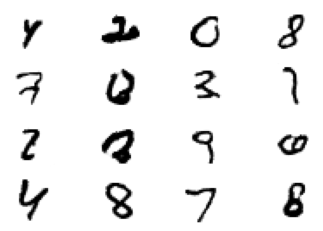



2/2 [==============================] - 0s 5ms/step
epoch -> [86/200], discriminator_loss_for_real_data = 306.49, discriminator_loss_for_fake_data = 306.43, generator_loss = 377.97

1/1 [==============================] - 0s 23ms/step


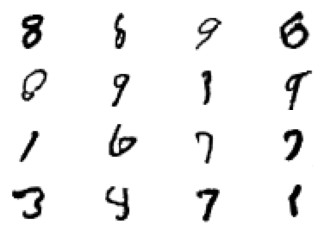



2/2 [==============================] - 0s 5ms/step
epoch -> [87/200], discriminator_loss_for_real_data = 306.30, discriminator_loss_for_fake_data = 305.92, generator_loss = 379.04

1/1 [==============================] - 0s 15ms/step


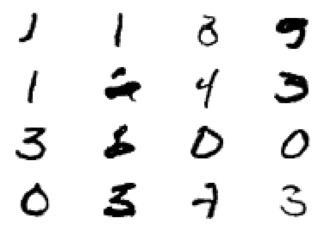



2/2 [==============================] - 0s 6ms/step
epoch -> [88/200], discriminator_loss_for_real_data = 305.59, discriminator_loss_for_fake_data = 304.73, generator_loss = 382.77

1/1 [==============================] - 0s 21ms/step


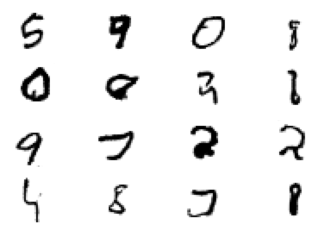



2/2 [==============================] - 0s 4ms/step
epoch -> [89/200], discriminator_loss_for_real_data = 304.91, discriminator_loss_for_fake_data = 304.64, generator_loss = 382.49

1/1 [==============================] - 0s 20ms/step


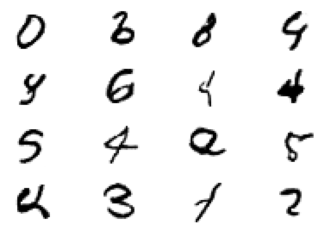



2/2 [==============================] - 0s 4ms/step
epoch -> [90/200], discriminator_loss_for_real_data = 304.79, discriminator_loss_for_fake_data = 304.99, generator_loss = 382.92

1/1 [==============================] - 0s 20ms/step


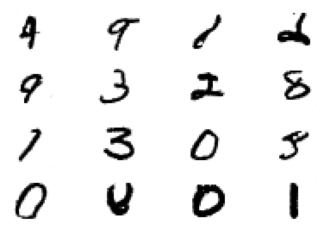



2/2 [==============================] - 0s 4ms/step
epoch -> [91/200], discriminator_loss_for_real_data = 304.48, discriminator_loss_for_fake_data = 304.59, generator_loss = 382.21

1/1 [==============================] - 0s 27ms/step


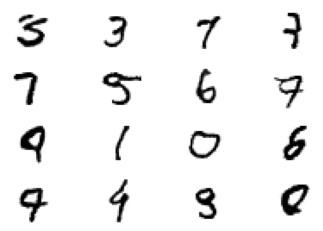



2/2 [==============================] - 0s 9ms/step
epoch -> [92/200], discriminator_loss_for_real_data = 304.26, discriminator_loss_for_fake_data = 303.36, generator_loss = 385.19

1/1 [==============================] - 0s 31ms/step


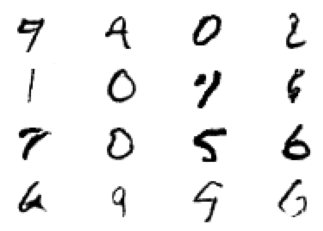



2/2 [==============================] - 0s 5ms/step
epoch -> [93/200], discriminator_loss_for_real_data = 303.33, discriminator_loss_for_fake_data = 301.58, generator_loss = 388.48

1/1 [==============================] - 0s 24ms/step


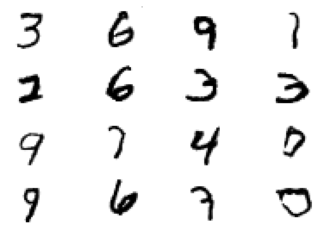



2/2 [==============================] - 0s 5ms/step
epoch -> [94/200], discriminator_loss_for_real_data = 302.55, discriminator_loss_for_fake_data = 302.82, generator_loss = 389.12

1/1 [==============================] - 0s 20ms/step


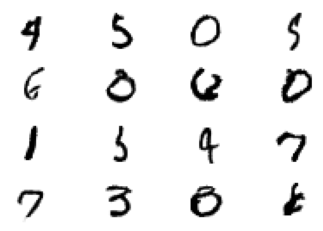



2/2 [==============================] - 0s 7ms/step
epoch -> [95/200], discriminator_loss_for_real_data = 303.10, discriminator_loss_for_fake_data = 301.89, generator_loss = 388.65

1/1 [==============================] - 0s 20ms/step


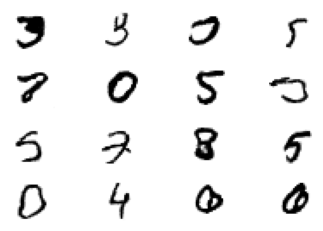



2/2 [==============================] - 0s 5ms/step
epoch -> [96/200], discriminator_loss_for_real_data = 300.73, discriminator_loss_for_fake_data = 301.46, generator_loss = 390.95

1/1 [==============================] - 0s 20ms/step


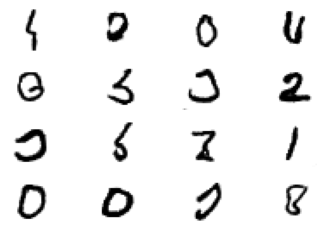



2/2 [==============================] - 0s 9ms/step
epoch -> [97/200], discriminator_loss_for_real_data = 302.29, discriminator_loss_for_fake_data = 300.92, generator_loss = 394.25

1/1 [==============================] - 0s 24ms/step


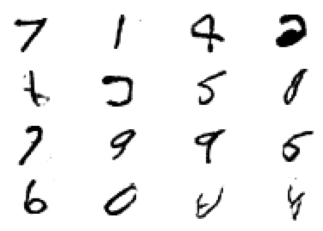



2/2 [==============================] - 0s 6ms/step
epoch -> [98/200], discriminator_loss_for_real_data = 300.61, discriminator_loss_for_fake_data = 299.82, generator_loss = 393.13

1/1 [==============================] - 0s 31ms/step


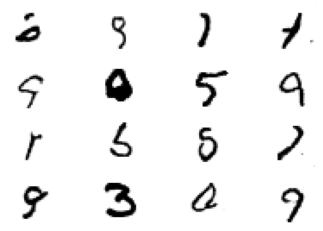



2/2 [==============================] - 0s 4ms/step
epoch -> [99/200], discriminator_loss_for_real_data = 299.79, discriminator_loss_for_fake_data = 299.24, generator_loss = 394.76

1/1 [==============================] - 0s 20ms/step


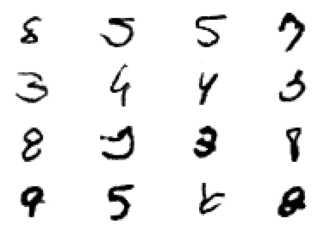



2/2 [==============================] - 0s 7ms/step
epoch -> [100/200], discriminator_loss_for_real_data = 299.34, discriminator_loss_for_fake_data = 298.15, generator_loss = 397.48

1/1 [==============================] - 0s 33ms/step


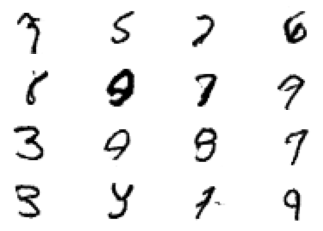



2/2 [==============================] - 0s 6ms/step
epoch -> [101/200], discriminator_loss_for_real_data = 297.92, discriminator_loss_for_fake_data = 297.15, generator_loss = 401.15

1/1 [==============================] - 0s 21ms/step


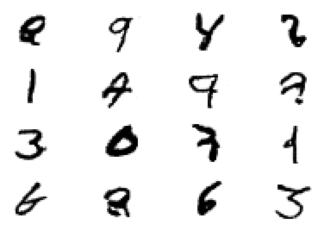



2/2 [==============================] - 0s 6ms/step
epoch -> [102/200], discriminator_loss_for_real_data = 297.86, discriminator_loss_for_fake_data = 296.94, generator_loss = 402.78

1/1 [==============================] - 0s 23ms/step


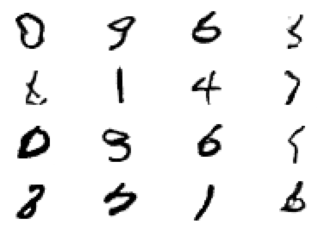



2/2 [==============================] - 0s 6ms/step
epoch -> [103/200], discriminator_loss_for_real_data = 297.99, discriminator_loss_for_fake_data = 297.13, generator_loss = 401.65

1/1 [==============================] - 0s 30ms/step


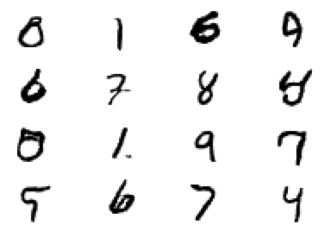



2/2 [==============================] - 0s 7ms/step
epoch -> [104/200], discriminator_loss_for_real_data = 296.88, discriminator_loss_for_fake_data = 294.15, generator_loss = 406.00

1/1 [==============================] - 0s 21ms/step


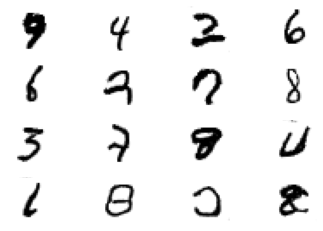



2/2 [==============================] - 0s 5ms/step
epoch -> [105/200], discriminator_loss_for_real_data = 295.72, discriminator_loss_for_fake_data = 294.92, generator_loss = 406.71

1/1 [==============================] - 0s 20ms/step


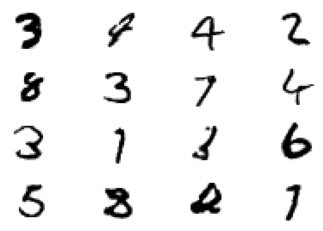



2/2 [==============================] - 0s 6ms/step
epoch -> [106/200], discriminator_loss_for_real_data = 293.78, discriminator_loss_for_fake_data = 291.80, generator_loss = 410.98

1/1 [==============================] - 0s 21ms/step


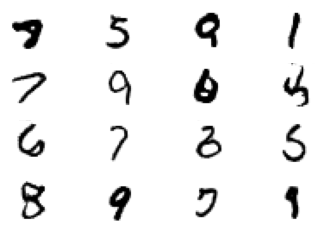



2/2 [==============================] - 0s 6ms/step
epoch -> [107/200], discriminator_loss_for_real_data = 292.65, discriminator_loss_for_fake_data = 291.43, generator_loss = 413.21

1/1 [==============================] - 0s 21ms/step


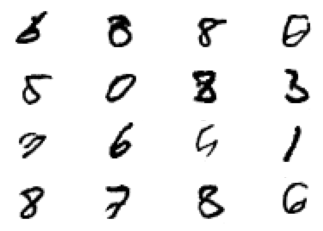



2/2 [==============================] - 0s 5ms/step
epoch -> [108/200], discriminator_loss_for_real_data = 293.71, discriminator_loss_for_fake_data = 290.68, generator_loss = 414.59

1/1 [==============================] - 0s 19ms/step


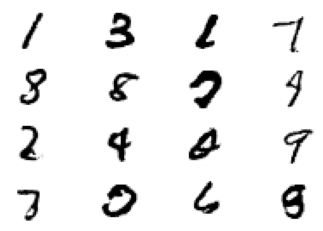



2/2 [==============================] - 0s 5ms/step
epoch -> [109/200], discriminator_loss_for_real_data = 293.39, discriminator_loss_for_fake_data = 289.64, generator_loss = 417.35

1/1 [==============================] - 0s 20ms/step


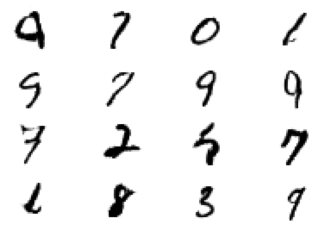



2/2 [==============================] - 0s 4ms/step
epoch -> [110/200], discriminator_loss_for_real_data = 292.62, discriminator_loss_for_fake_data = 289.07, generator_loss = 420.11

1/1 [==============================] - 0s 22ms/step


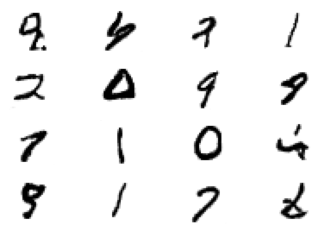



2/2 [==============================] - 0s 5ms/step
epoch -> [111/200], discriminator_loss_for_real_data = 290.25, discriminator_loss_for_fake_data = 287.85, generator_loss = 420.32

1/1 [==============================] - 0s 23ms/step


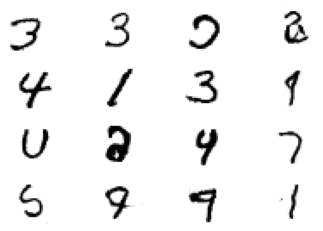



2/2 [==============================] - 0s 6ms/step
epoch -> [112/200], discriminator_loss_for_real_data = 290.29, discriminator_loss_for_fake_data = 286.69, generator_loss = 425.18

1/1 [==============================] - 0s 39ms/step


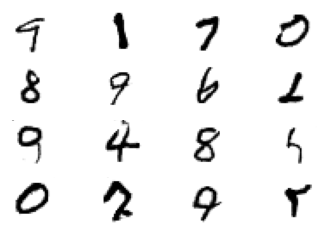



2/2 [==============================] - 0s 7ms/step
epoch -> [113/200], discriminator_loss_for_real_data = 288.78, discriminator_loss_for_fake_data = 285.19, generator_loss = 429.55

1/1 [==============================] - 0s 21ms/step


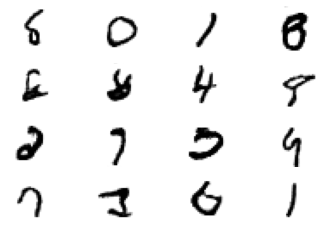



2/2 [==============================] - 0s 7ms/step
epoch -> [114/200], discriminator_loss_for_real_data = 289.85, discriminator_loss_for_fake_data = 285.88, generator_loss = 428.50

1/1 [==============================] - 0s 30ms/step


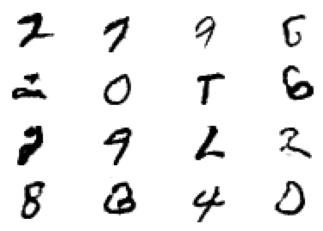



2/2 [==============================] - 0s 5ms/step
epoch -> [115/200], discriminator_loss_for_real_data = 288.11, discriminator_loss_for_fake_data = 284.50, generator_loss = 431.93

1/1 [==============================] - 0s 23ms/step


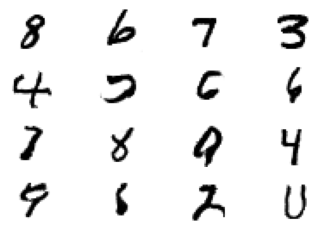



2/2 [==============================] - 0s 5ms/step
epoch -> [116/200], discriminator_loss_for_real_data = 286.73, discriminator_loss_for_fake_data = 283.38, generator_loss = 432.56

1/1 [==============================] - 0s 29ms/step


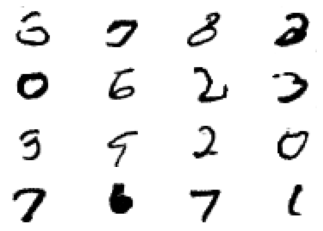



2/2 [==============================] - 0s 5ms/step
epoch -> [117/200], discriminator_loss_for_real_data = 287.74, discriminator_loss_for_fake_data = 282.97, generator_loss = 434.43

1/1 [==============================] - 0s 22ms/step


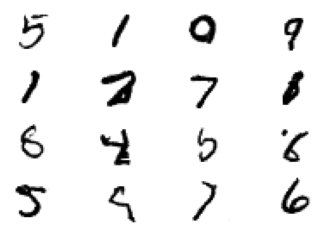



2/2 [==============================] - 0s 5ms/step
epoch -> [118/200], discriminator_loss_for_real_data = 285.80, discriminator_loss_for_fake_data = 279.98, generator_loss = 438.47

1/1 [==============================] - 0s 27ms/step


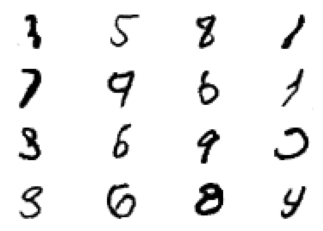



2/2 [==============================] - 0s 4ms/step
epoch -> [119/200], discriminator_loss_for_real_data = 285.07, discriminator_loss_for_fake_data = 279.77, generator_loss = 440.63

1/1 [==============================] - 0s 22ms/step


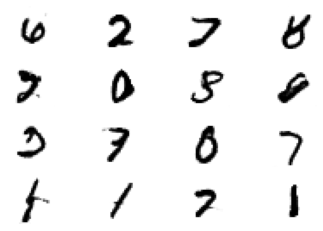



2/2 [==============================] - 0s 6ms/step
epoch -> [120/200], discriminator_loss_for_real_data = 283.85, discriminator_loss_for_fake_data = 279.52, generator_loss = 441.77

1/1 [==============================] - 0s 22ms/step


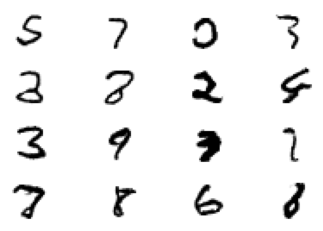



2/2 [==============================] - 0s 7ms/step
epoch -> [121/200], discriminator_loss_for_real_data = 282.82, discriminator_loss_for_fake_data = 277.70, generator_loss = 447.55

1/1 [==============================] - 0s 20ms/step


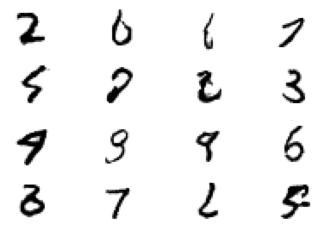



2/2 [==============================] - 0s 7ms/step
epoch -> [122/200], discriminator_loss_for_real_data = 281.73, discriminator_loss_for_fake_data = 275.46, generator_loss = 450.79

1/1 [==============================] - 0s 20ms/step


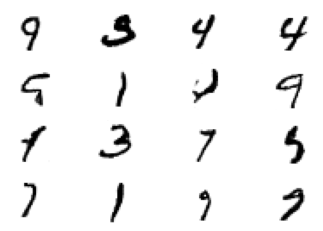



2/2 [==============================] - 0s 6ms/step
epoch -> [123/200], discriminator_loss_for_real_data = 281.56, discriminator_loss_for_fake_data = 274.98, generator_loss = 450.97

1/1 [==============================] - 0s 20ms/step


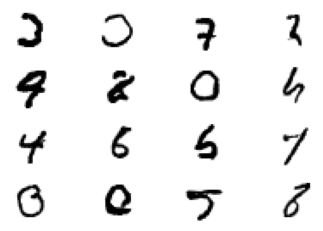



2/2 [==============================] - 0s 7ms/step
epoch -> [124/200], discriminator_loss_for_real_data = 279.64, discriminator_loss_for_fake_data = 273.51, generator_loss = 455.68

1/1 [==============================] - 0s 22ms/step


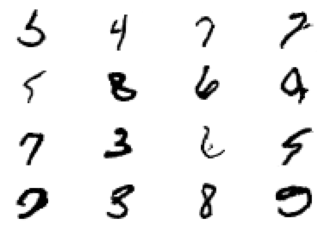



2/2 [==============================] - 0s 5ms/step
epoch -> [125/200], discriminator_loss_for_real_data = 277.88, discriminator_loss_for_fake_data = 271.53, generator_loss = 458.82

1/1 [==============================] - 0s 20ms/step


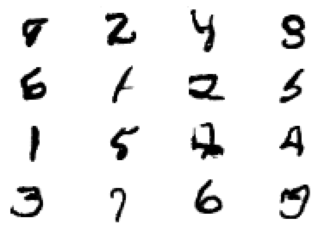



2/2 [==============================] - 0s 7ms/step
epoch -> [126/200], discriminator_loss_for_real_data = 278.69, discriminator_loss_for_fake_data = 272.27, generator_loss = 461.22

1/1 [==============================] - 0s 29ms/step


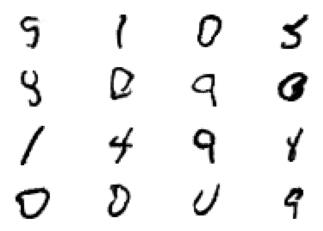



2/2 [==============================] - 0s 4ms/step
epoch -> [127/200], discriminator_loss_for_real_data = 276.77, discriminator_loss_for_fake_data = 270.65, generator_loss = 463.55

1/1 [==============================] - 0s 22ms/step


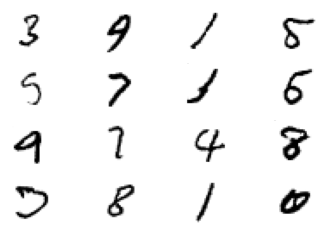



2/2 [==============================] - 0s 6ms/step
epoch -> [128/200], discriminator_loss_for_real_data = 278.08, discriminator_loss_for_fake_data = 271.36, generator_loss = 464.05

1/1 [==============================] - 0s 19ms/step


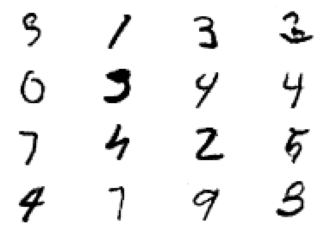



2/2 [==============================] - 0s 6ms/step
epoch -> [129/200], discriminator_loss_for_real_data = 275.98, discriminator_loss_for_fake_data = 269.33, generator_loss = 468.66

1/1 [==============================] - 0s 30ms/step


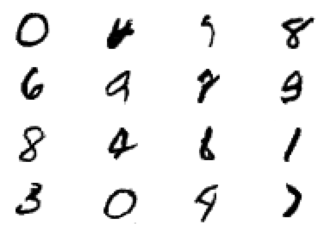



2/2 [==============================] - 0s 4ms/step
epoch -> [130/200], discriminator_loss_for_real_data = 274.36, discriminator_loss_for_fake_data = 268.04, generator_loss = 472.27

1/1 [==============================] - 0s 45ms/step


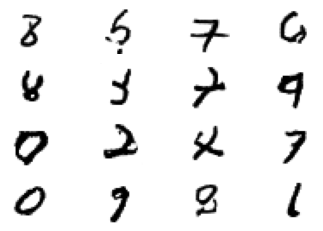



2/2 [==============================] - 0s 5ms/step
epoch -> [131/200], discriminator_loss_for_real_data = 274.75, discriminator_loss_for_fake_data = 266.57, generator_loss = 475.34

1/1 [==============================] - 0s 27ms/step


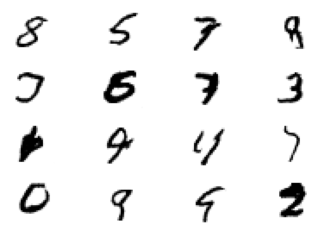



2/2 [==============================] - 0s 6ms/step
epoch -> [132/200], discriminator_loss_for_real_data = 274.06, discriminator_loss_for_fake_data = 266.18, generator_loss = 476.50

1/1 [==============================] - 0s 36ms/step


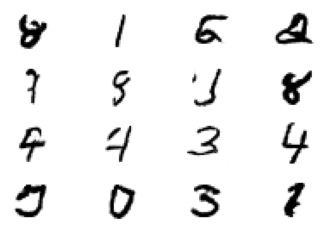



2/2 [==============================] - 0s 9ms/step
epoch -> [133/200], discriminator_loss_for_real_data = 271.02, discriminator_loss_for_fake_data = 262.55, generator_loss = 485.36

1/1 [==============================] - 0s 20ms/step


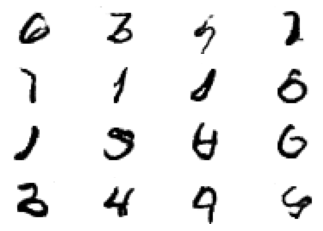



2/2 [==============================] - 0s 7ms/step
epoch -> [134/200], discriminator_loss_for_real_data = 270.98, discriminator_loss_for_fake_data = 262.97, generator_loss = 482.54

1/1 [==============================] - 0s 21ms/step


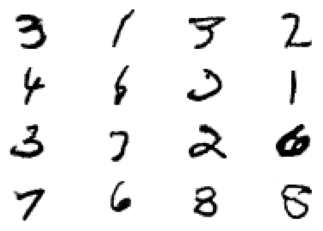



2/2 [==============================] - 0s 7ms/step
epoch -> [135/200], discriminator_loss_for_real_data = 269.95, discriminator_loss_for_fake_data = 261.19, generator_loss = 488.50

1/1 [==============================] - 0s 21ms/step


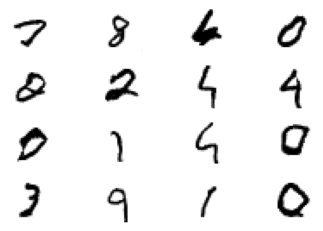



2/2 [==============================] - 0s 6ms/step
epoch -> [136/200], discriminator_loss_for_real_data = 270.97, discriminator_loss_for_fake_data = 262.41, generator_loss = 488.00

1/1 [==============================] - 0s 20ms/step


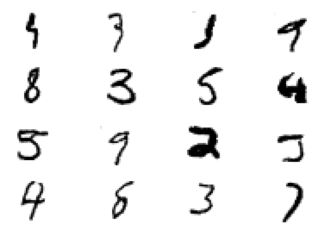



2/2 [==============================] - 0s 4ms/step
epoch -> [137/200], discriminator_loss_for_real_data = 269.06, discriminator_loss_for_fake_data = 260.42, generator_loss = 489.92

1/1 [==============================] - 0s 20ms/step


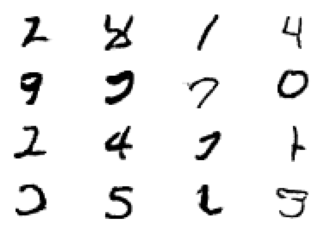



2/2 [==============================] - 0s 8ms/step
epoch -> [138/200], discriminator_loss_for_real_data = 267.89, discriminator_loss_for_fake_data = 258.09, generator_loss = 492.02

1/1 [==============================] - 0s 21ms/step


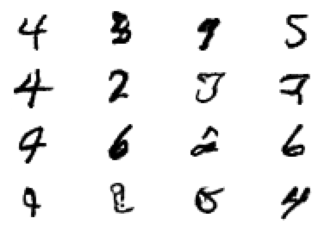



2/2 [==============================] - 0s 9ms/step
epoch -> [139/200], discriminator_loss_for_real_data = 265.36, discriminator_loss_for_fake_data = 256.85, generator_loss = 499.36

1/1 [==============================] - 0s 22ms/step


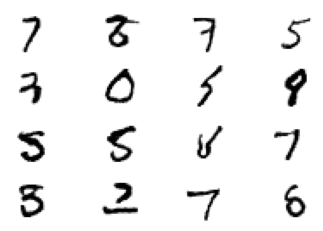



2/2 [==============================] - 0s 4ms/step
epoch -> [140/200], discriminator_loss_for_real_data = 266.35, discriminator_loss_for_fake_data = 256.10, generator_loss = 499.73

1/1 [==============================] - 0s 21ms/step


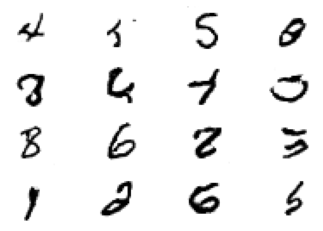



2/2 [==============================] - 0s 5ms/step
epoch -> [141/200], discriminator_loss_for_real_data = 266.59, discriminator_loss_for_fake_data = 255.93, generator_loss = 506.34

1/1 [==============================] - 0s 20ms/step


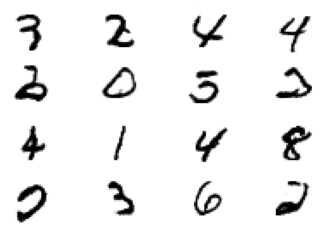



2/2 [==============================] - 0s 6ms/step
epoch -> [142/200], discriminator_loss_for_real_data = 265.41, discriminator_loss_for_fake_data = 255.25, generator_loss = 507.58

1/1 [==============================] - 0s 20ms/step


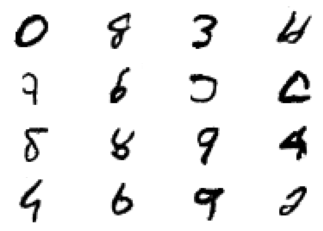



2/2 [==============================] - 0s 4ms/step
epoch -> [143/200], discriminator_loss_for_real_data = 264.35, discriminator_loss_for_fake_data = 253.73, generator_loss = 510.82

1/1 [==============================] - 0s 27ms/step


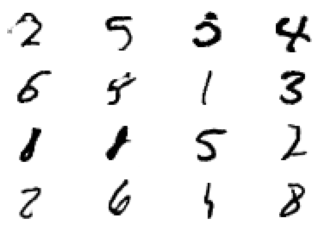



2/2 [==============================] - 0s 4ms/step
epoch -> [144/200], discriminator_loss_for_real_data = 263.42, discriminator_loss_for_fake_data = 253.90, generator_loss = 512.87

1/1 [==============================] - 0s 23ms/step


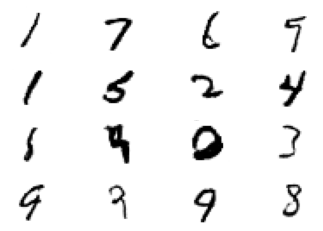



2/2 [==============================] - 0s 5ms/step
epoch -> [145/200], discriminator_loss_for_real_data = 263.67, discriminator_loss_for_fake_data = 252.67, generator_loss = 513.09

1/1 [==============================] - 0s 19ms/step


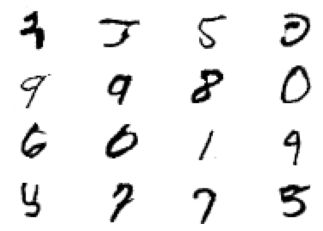



2/2 [==============================] - 0s 6ms/step
epoch -> [146/200], discriminator_loss_for_real_data = 262.38, discriminator_loss_for_fake_data = 250.92, generator_loss = 520.34

1/1 [==============================] - 0s 21ms/step


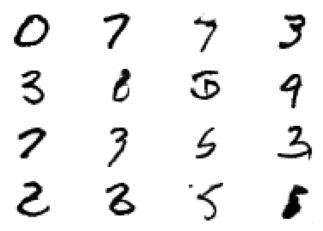



2/2 [==============================] - 0s 8ms/step
epoch -> [147/200], discriminator_loss_for_real_data = 260.67, discriminator_loss_for_fake_data = 249.53, generator_loss = 523.37

1/1 [==============================] - 0s 20ms/step


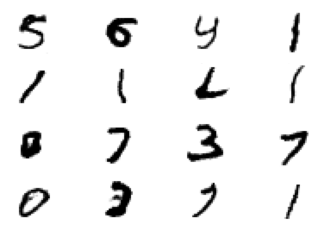



2/2 [==============================] - 0s 4ms/step
epoch -> [148/200], discriminator_loss_for_real_data = 260.81, discriminator_loss_for_fake_data = 249.57, generator_loss = 522.60

1/1 [==============================] - 0s 19ms/step


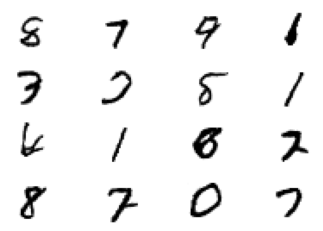



2/2 [==============================] - 0s 10ms/step
epoch -> [149/200], discriminator_loss_for_real_data = 259.42, discriminator_loss_for_fake_data = 247.61, generator_loss = 525.54

1/1 [==============================] - 0s 21ms/step


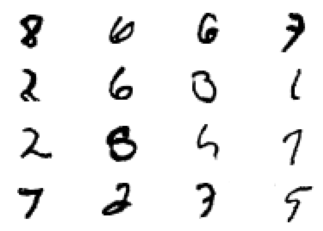



2/2 [==============================] - 0s 5ms/step
epoch -> [150/200], discriminator_loss_for_real_data = 258.17, discriminator_loss_for_fake_data = 245.32, generator_loss = 534.93

1/1 [==============================] - 0s 24ms/step


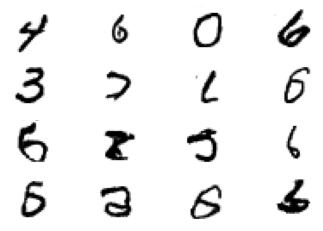



2/2 [==============================] - 0s 5ms/step
epoch -> [151/200], discriminator_loss_for_real_data = 258.89, discriminator_loss_for_fake_data = 246.04, generator_loss = 533.84

1/1 [==============================] - 0s 19ms/step


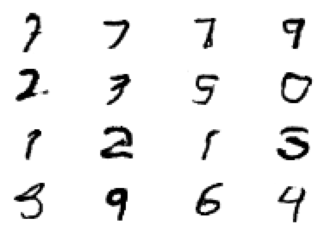



2/2 [==============================] - 0s 5ms/step
epoch -> [152/200], discriminator_loss_for_real_data = 257.20, discriminator_loss_for_fake_data = 245.26, generator_loss = 536.13

1/1 [==============================] - 0s 19ms/step


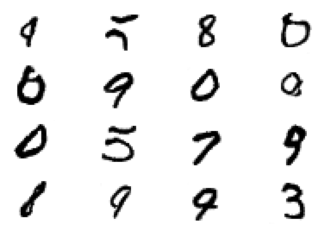



2/2 [==============================] - 0s 6ms/step
epoch -> [153/200], discriminator_loss_for_real_data = 255.83, discriminator_loss_for_fake_data = 244.36, generator_loss = 540.44

1/1 [==============================] - 0s 23ms/step


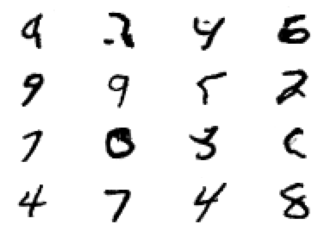



2/2 [==============================] - 0s 7ms/step
epoch -> [154/200], discriminator_loss_for_real_data = 255.37, discriminator_loss_for_fake_data = 243.64, generator_loss = 542.53

1/1 [==============================] - 0s 21ms/step


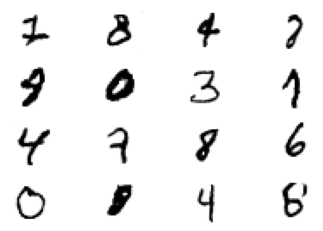



2/2 [==============================] - 0s 4ms/step
epoch -> [155/200], discriminator_loss_for_real_data = 257.00, discriminator_loss_for_fake_data = 243.34, generator_loss = 543.58

1/1 [==============================] - 0s 19ms/step


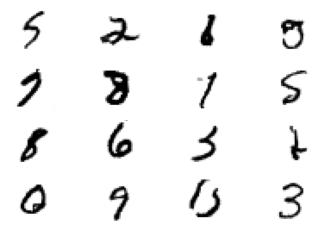



2/2 [==============================] - 0s 8ms/step
epoch -> [156/200], discriminator_loss_for_real_data = 253.19, discriminator_loss_for_fake_data = 239.90, generator_loss = 554.12

1/1 [==============================] - 0s 24ms/step


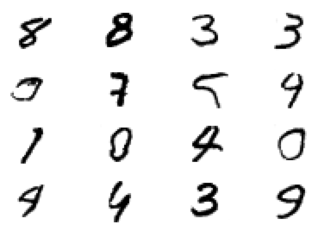



2/2 [==============================] - 0s 7ms/step
epoch -> [157/200], discriminator_loss_for_real_data = 255.57, discriminator_loss_for_fake_data = 241.32, generator_loss = 549.24

1/1 [==============================] - 0s 47ms/step


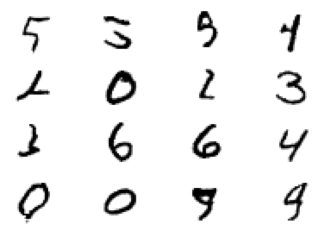



2/2 [==============================] - 0s 5ms/step
epoch -> [158/200], discriminator_loss_for_real_data = 253.43, discriminator_loss_for_fake_data = 240.13, generator_loss = 555.39

1/1 [==============================] - 0s 21ms/step


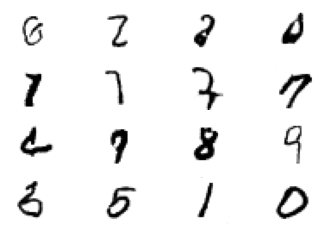



2/2 [==============================] - 0s 6ms/step
epoch -> [159/200], discriminator_loss_for_real_data = 253.07, discriminator_loss_for_fake_data = 238.70, generator_loss = 555.81

1/1 [==============================] - 0s 22ms/step


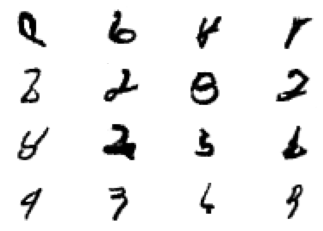



2/2 [==============================] - 0s 5ms/step
epoch -> [160/200], discriminator_loss_for_real_data = 250.30, discriminator_loss_for_fake_data = 238.43, generator_loss = 561.17

1/1 [==============================] - 0s 20ms/step


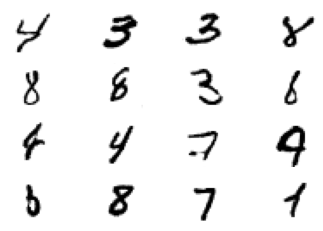



2/2 [==============================] - 0s 7ms/step
epoch -> [161/200], discriminator_loss_for_real_data = 251.25, discriminator_loss_for_fake_data = 236.46, generator_loss = 564.64

1/1 [==============================] - 0s 20ms/step


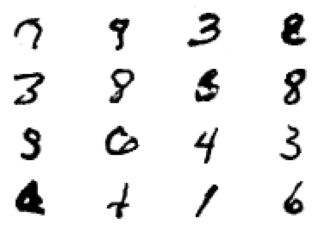



2/2 [==============================] - 0s 4ms/step
epoch -> [162/200], discriminator_loss_for_real_data = 250.58, discriminator_loss_for_fake_data = 236.21, generator_loss = 566.20

1/1 [==============================] - 0s 24ms/step


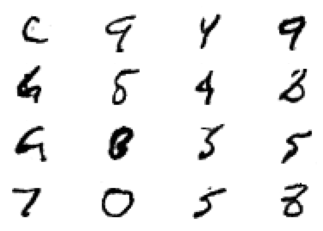



2/2 [==============================] - 0s 7ms/step
epoch -> [163/200], discriminator_loss_for_real_data = 250.82, discriminator_loss_for_fake_data = 236.61, generator_loss = 563.28

1/1 [==============================] - 0s 24ms/step


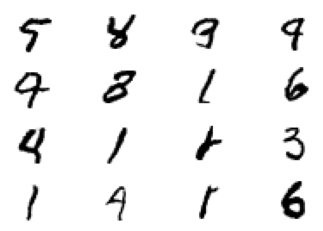



2/2 [==============================] - 0s 7ms/step
epoch -> [164/200], discriminator_loss_for_real_data = 248.88, discriminator_loss_for_fake_data = 234.79, generator_loss = 567.78

1/1 [==============================] - 0s 21ms/step


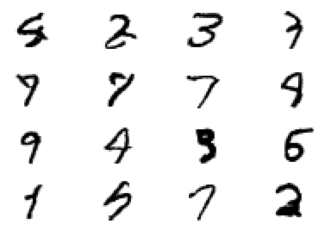



2/2 [==============================] - 0s 4ms/step
epoch -> [165/200], discriminator_loss_for_real_data = 247.61, discriminator_loss_for_fake_data = 232.73, generator_loss = 576.68

1/1 [==============================] - 0s 26ms/step


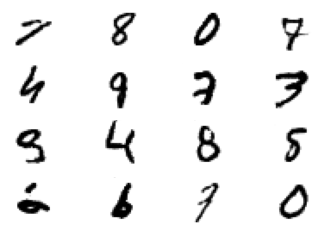



2/2 [==============================] - 0s 8ms/step
epoch -> [166/200], discriminator_loss_for_real_data = 247.21, discriminator_loss_for_fake_data = 233.28, generator_loss = 576.76

1/1 [==============================] - 0s 21ms/step


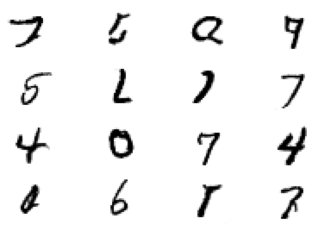



2/2 [==============================] - 0s 6ms/step
epoch -> [167/200], discriminator_loss_for_real_data = 245.21, discriminator_loss_for_fake_data = 230.45, generator_loss = 582.68

1/1 [==============================] - 0s 21ms/step


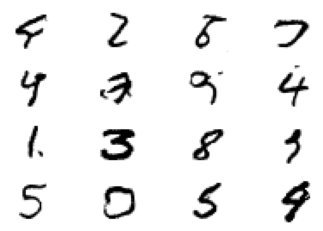



2/2 [==============================] - 0s 5ms/step
epoch -> [168/200], discriminator_loss_for_real_data = 247.43, discriminator_loss_for_fake_data = 233.16, generator_loss = 581.14

1/1 [==============================] - 0s 20ms/step


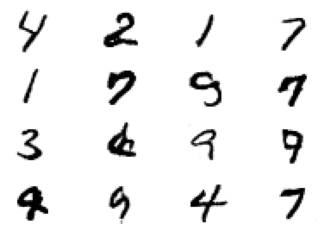



2/2 [==============================] - 0s 7ms/step
epoch -> [169/200], discriminator_loss_for_real_data = 245.68, discriminator_loss_for_fake_data = 230.29, generator_loss = 579.26

1/1 [==============================] - 0s 20ms/step


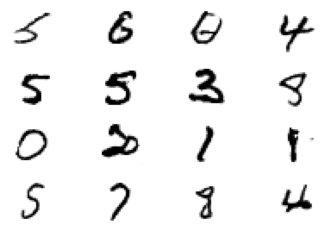



2/2 [==============================] - 0s 6ms/step
epoch -> [170/200], discriminator_loss_for_real_data = 246.62, discriminator_loss_for_fake_data = 231.49, generator_loss = 582.79

1/1 [==============================] - 0s 21ms/step


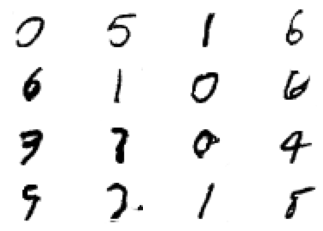



2/2 [==============================] - 0s 5ms/step
epoch -> [171/200], discriminator_loss_for_real_data = 244.62, discriminator_loss_for_fake_data = 229.14, generator_loss = 588.69

1/1 [==============================] - 0s 20ms/step


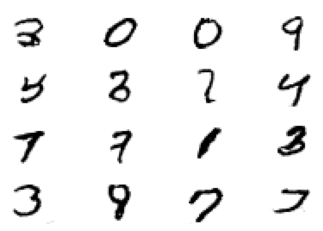



2/2 [==============================] - 0s 6ms/step
epoch -> [172/200], discriminator_loss_for_real_data = 245.01, discriminator_loss_for_fake_data = 230.04, generator_loss = 587.57

1/1 [==============================] - 0s 24ms/step


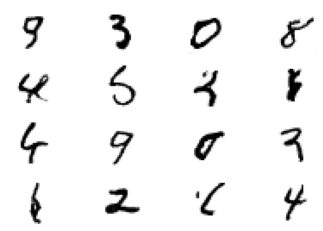



2/2 [==============================] - 0s 5ms/step
epoch -> [173/200], discriminator_loss_for_real_data = 243.55, discriminator_loss_for_fake_data = 228.77, generator_loss = 594.38

1/1 [==============================] - 0s 24ms/step


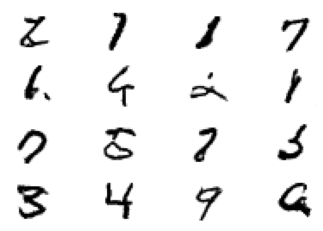



2/2 [==============================] - 0s 8ms/step
epoch -> [174/200], discriminator_loss_for_real_data = 243.81, discriminator_loss_for_fake_data = 228.38, generator_loss = 595.75

1/1 [==============================] - 0s 33ms/step


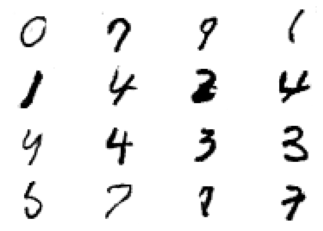



2/2 [==============================] - 0s 7ms/step
epoch -> [175/200], discriminator_loss_for_real_data = 243.04, discriminator_loss_for_fake_data = 228.16, generator_loss = 597.90

1/1 [==============================] - 0s 20ms/step


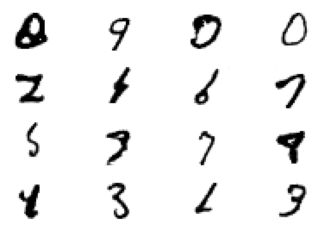



2/2 [==============================] - 0s 6ms/step
epoch -> [176/200], discriminator_loss_for_real_data = 242.21, discriminator_loss_for_fake_data = 225.88, generator_loss = 601.73

1/1 [==============================] - 0s 20ms/step


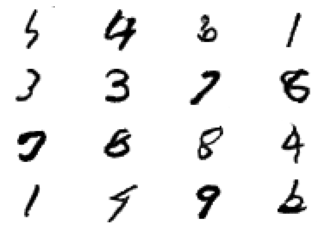



2/2 [==============================] - 0s 6ms/step
epoch -> [177/200], discriminator_loss_for_real_data = 242.79, discriminator_loss_for_fake_data = 226.81, generator_loss = 597.17

1/1 [==============================] - 0s 20ms/step


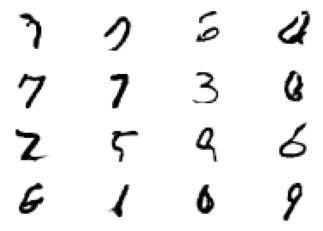



2/2 [==============================] - 0s 6ms/step
epoch -> [178/200], discriminator_loss_for_real_data = 241.13, discriminator_loss_for_fake_data = 224.26, generator_loss = 603.07

1/1 [==============================] - 0s 26ms/step


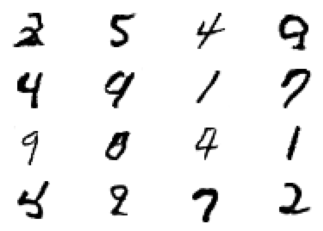



2/2 [==============================] - 0s 5ms/step
epoch -> [179/200], discriminator_loss_for_real_data = 242.34, discriminator_loss_for_fake_data = 224.81, generator_loss = 606.65

1/1 [==============================] - 0s 32ms/step


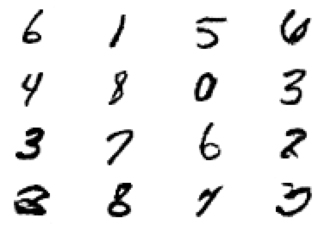



2/2 [==============================] - 0s 6ms/step
epoch -> [180/200], discriminator_loss_for_real_data = 240.45, discriminator_loss_for_fake_data = 225.47, generator_loss = 608.33

1/1 [==============================] - 0s 27ms/step


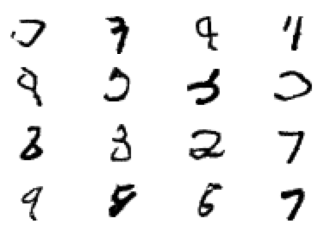



2/2 [==============================] - 0s 12ms/step
epoch -> [181/200], discriminator_loss_for_real_data = 238.72, discriminator_loss_for_fake_data = 223.12, generator_loss = 615.64

1/1 [==============================] - 0s 21ms/step


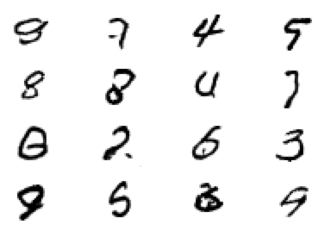



2/2 [==============================] - 0s 6ms/step
epoch -> [182/200], discriminator_loss_for_real_data = 237.79, discriminator_loss_for_fake_data = 221.72, generator_loss = 616.39

1/1 [==============================] - 0s 19ms/step


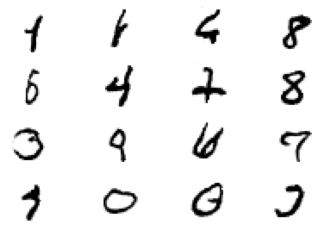



2/2 [==============================] - 0s 5ms/step
epoch -> [183/200], discriminator_loss_for_real_data = 238.26, discriminator_loss_for_fake_data = 222.05, generator_loss = 616.53

1/1 [==============================] - 0s 20ms/step


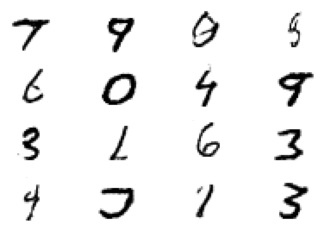



2/2 [==============================] - 0s 6ms/step
epoch -> [184/200], discriminator_loss_for_real_data = 237.57, discriminator_loss_for_fake_data = 222.30, generator_loss = 612.74

1/1 [==============================] - 0s 25ms/step


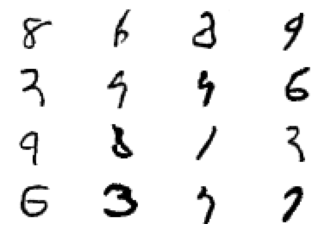



2/2 [==============================] - 0s 7ms/step
epoch -> [185/200], discriminator_loss_for_real_data = 237.59, discriminator_loss_for_fake_data = 221.17, generator_loss = 621.60

1/1 [==============================] - 0s 21ms/step


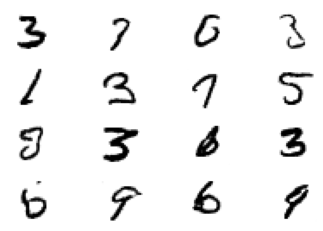



2/2 [==============================] - 0s 4ms/step
epoch -> [186/200], discriminator_loss_for_real_data = 235.34, discriminator_loss_for_fake_data = 219.51, generator_loss = 626.85

1/1 [==============================] - 0s 23ms/step


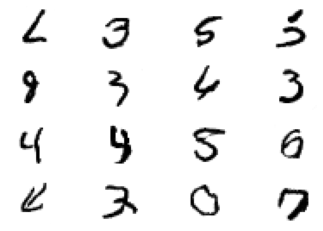



2/2 [==============================] - 0s 7ms/step
epoch -> [187/200], discriminator_loss_for_real_data = 234.40, discriminator_loss_for_fake_data = 218.17, generator_loss = 634.40

1/1 [==============================] - 0s 25ms/step


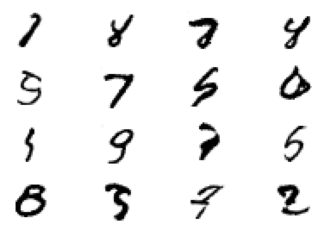



2/2 [==============================] - 0s 6ms/step
epoch -> [188/200], discriminator_loss_for_real_data = 235.11, discriminator_loss_for_fake_data = 218.45, generator_loss = 626.97

1/1 [==============================] - 0s 20ms/step


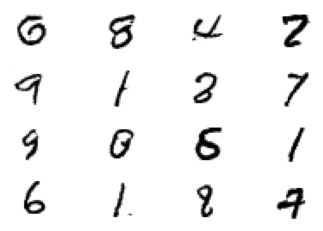



2/2 [==============================] - 0s 6ms/step
epoch -> [189/200], discriminator_loss_for_real_data = 234.30, discriminator_loss_for_fake_data = 219.20, generator_loss = 634.27

1/1 [==============================] - 0s 35ms/step


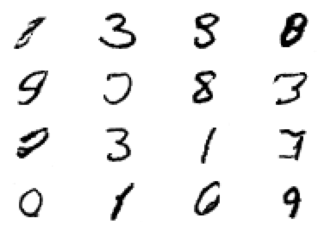



2/2 [==============================] - 0s 5ms/step
epoch -> [190/200], discriminator_loss_for_real_data = 233.46, discriminator_loss_for_fake_data = 216.67, generator_loss = 639.05

1/1 [==============================] - 0s 20ms/step


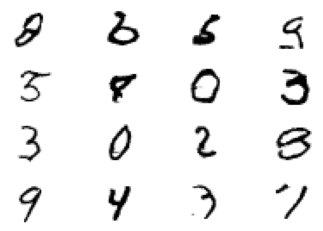



2/2 [==============================] - 0s 5ms/step
epoch -> [191/200], discriminator_loss_for_real_data = 233.88, discriminator_loss_for_fake_data = 217.13, generator_loss = 638.00

1/1 [==============================] - 0s 23ms/step


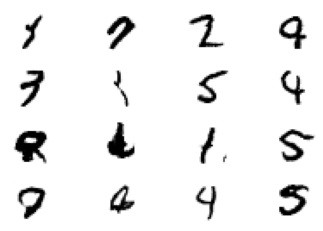



2/2 [==============================] - 0s 7ms/step
epoch -> [192/200], discriminator_loss_for_real_data = 233.43, discriminator_loss_for_fake_data = 216.34, generator_loss = 639.14

1/1 [==============================] - 0s 33ms/step


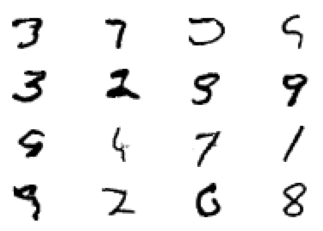



2/2 [==============================] - 0s 5ms/step
epoch -> [193/200], discriminator_loss_for_real_data = 232.98, discriminator_loss_for_fake_data = 215.68, generator_loss = 642.02

1/1 [==============================] - 0s 21ms/step


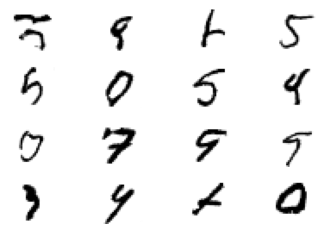



2/2 [==============================] - 0s 6ms/step
epoch -> [194/200], discriminator_loss_for_real_data = 233.68, discriminator_loss_for_fake_data = 216.10, generator_loss = 639.82

1/1 [==============================] - 0s 19ms/step


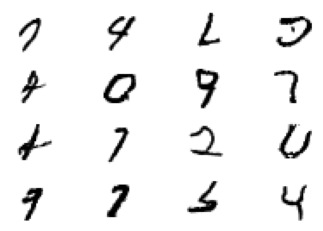



2/2 [==============================] - 0s 8ms/step
epoch -> [195/200], discriminator_loss_for_real_data = 232.09, discriminator_loss_for_fake_data = 216.17, generator_loss = 643.16

1/1 [==============================] - 0s 20ms/step


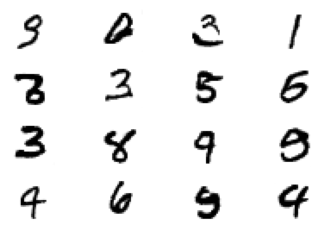



2/2 [==============================] - 0s 6ms/step
epoch -> [196/200], discriminator_loss_for_real_data = 231.92, discriminator_loss_for_fake_data = 214.32, generator_loss = 650.41

1/1 [==============================] - 0s 19ms/step


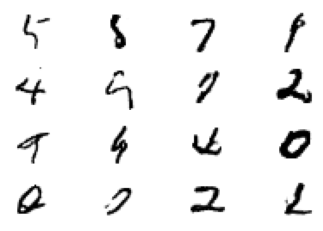



2/2 [==============================] - 0s 5ms/step
epoch -> [197/200], discriminator_loss_for_real_data = 230.04, discriminator_loss_for_fake_data = 212.08, generator_loss = 656.57

1/1 [==============================] - 0s 20ms/step


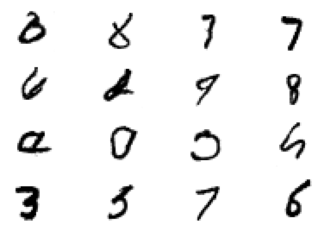



2/2 [==============================] - 0s 5ms/step
epoch -> [198/200], discriminator_loss_for_real_data = 228.70, discriminator_loss_for_fake_data = 211.71, generator_loss = 656.57

1/1 [==============================] - 0s 21ms/step


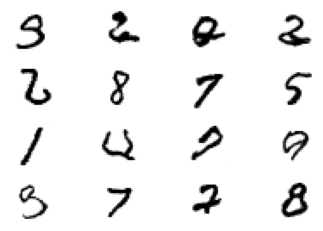



2/2 [==============================] - 0s 6ms/step
epoch -> [199/200], discriminator_loss_for_real_data = 228.96, discriminator_loss_for_fake_data = 212.64, generator_loss = 655.34

1/1 [==============================] - 0s 22ms/step


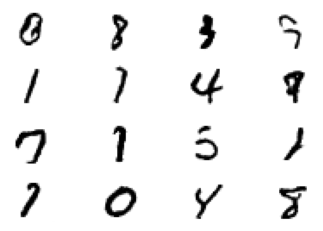



2/2 [==============================] - 0s 4ms/step
epoch -> [200/200], discriminator_loss_for_real_data = 229.11, discriminator_loss_for_fake_data = 212.72, generator_loss = 658.58

1/1 [==============================] - 0s 35ms/step


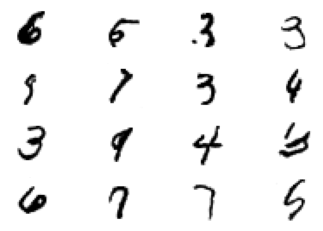

In [81]:
with tf.device(device_name):

  latent_dim = 100
  n_epochs = 200
  d_model = define_discriminator()
  g_model = define_generator(latent_dim)
  gan_model = define_gan(g_model, d_model)
  dataset = load_real_samples()
  print('\nREADY TO GO !!!\n')
  
  d_loss_r, d_loss_f, g_loss = train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs)

## Plot Loss Values

In [82]:
loaded = np.load('/content/drive/MyDrive/C-GAN-Case-B/1/loss_record.npz')
print(loaded['a'].shape)
print(loaded['b'].shape)
print(loaded['c'].shape)

(200,)
(200,)
(200,)


In [83]:
import matplotlib.pyplot as plot

g_loss = np.array(loaded['c'])

In [84]:
d_loss = np.array([(i+j) for i,j in zip(loaded['a'], loaded['b'])])

In [85]:
# print(d_loss_r)
# print(d_loss_f)
# print(d_loss)
# print(g_loss)

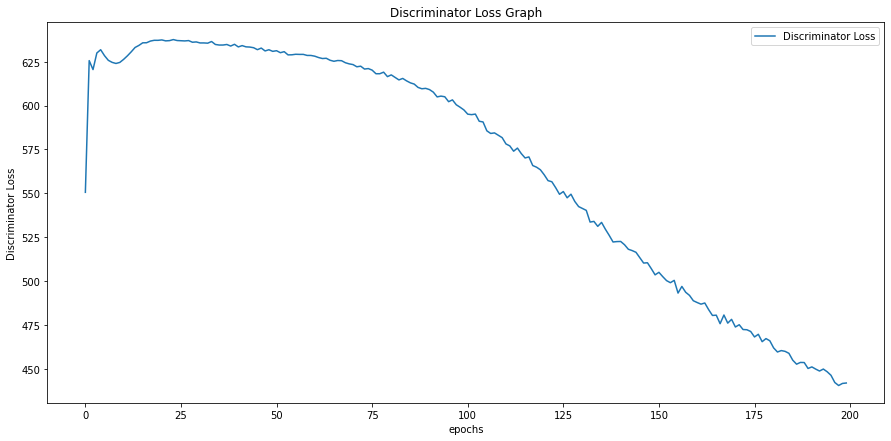

In [86]:
plt.figure(figsize=(15,7))
plt.plot(d_loss)
plt.title('Discriminator Loss Graph')
plt.ylabel('Discriminator Loss')
plt.xlabel('epochs')
plt.legend(["Discriminator Loss"], loc='upper right')
plt.show()

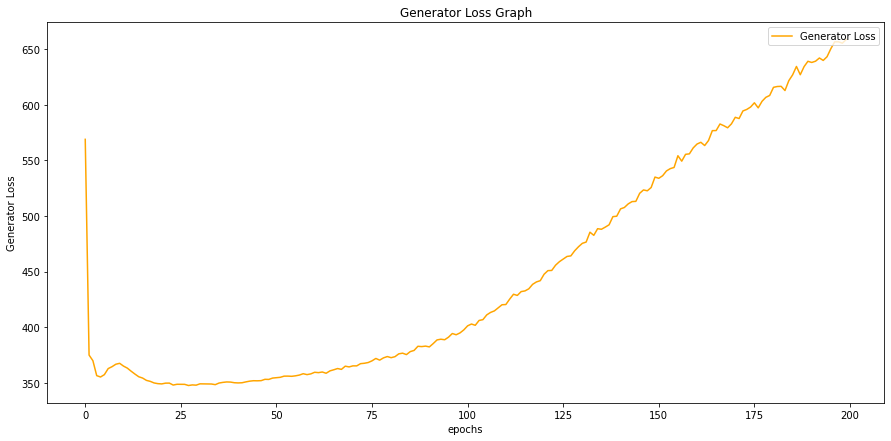

In [87]:
plt.figure(figsize=(15,7))
plt.plot(g_loss,color='orange')
plt.title('Generator Loss Graph')
plt.ylabel('Generator Loss')
plt.xlabel('epochs')
plt.legend(["Generator Loss"], loc='upper right')
plt.show()

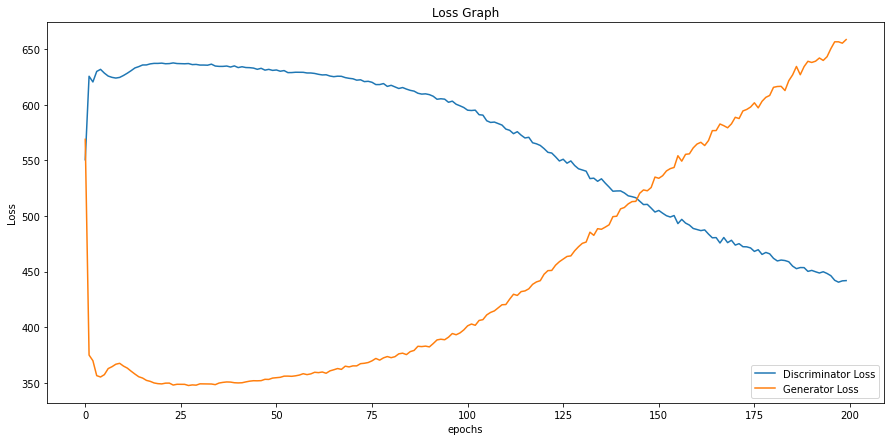

In [88]:
plt.figure(figsize=(15,7))
plt.plot(d_loss)
plt.plot(g_loss)
plt.title('Loss Graph')
plt.ylabel('Loss')
plt.xlabel('epochs')
plt.legend(["Discriminator Loss", "Generator Loss"], loc='lower right')
plt.show()

# Prediction

latent points(latent points and labels):  (16, 100) (16, 5)
1/1 [==============================] - 0s 27ms/step

Generated images with labels:  (16, 28, 28, 1) 



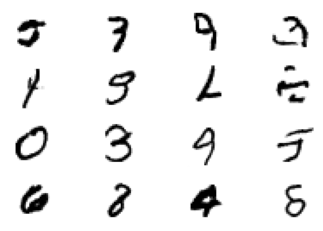

In [89]:
latent_dim = 100
n_samples = 16
z_input, labels = generate_latent_points(latent_dim, n_samples)
print("latent points(latent points and labels): ",z_input.shape, labels.shape)
data = [z_input,labels]
pred = g_model.predict(data)
pred = (pred +1 ) / 2.0
print("\nGenerated images with labels: ",pred.shape,'\n')
save_plot(pred,labels,n=4)

                                              -:END:-

In [90]:
# import numpy as np
# test_array = np.random.rand(3, 2)
# test_vector = np.random.rand(4)
# test_vector_1 = np.random.rand(4,1,4,2)
# np.savez_compressed('ok.npz', a=test_array, b=test_vector, c=test_vector_1)
# loaded = np.load('ok.npz')
# print(loaded['a'].shape)
# print(loaded['b'].shape)
# print(loaded['c'].shape)